In [1]:
import os
import json
import pickle
import glob
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm

from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
import xgboost as xgb
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score

import yfinance as yf
import pandas_datareader.data as web

In [2]:
DAILY_PKL = os.path.join("temp_output", "daily_X_y.pkl")
QUARTERLY_PKL = os.path.join("temp_output", "quarterly_X_y.pkl")
LOG_DIR_DAILY = "model_logs_d"
LOG_DIR_QUARTERLY = "model_logs_q"
MODEL_TYPES = ['RF', 'SVM', 'GB', 'XGB']

In [3]:
def load_logs(log_dir):
    """Load all CSV log files from a log directory and return one combined DataFrame."""
    files = [os.path.join(log_dir, f) for f in os.listdir(log_dir) if f.endswith(".csv")]
    if not files:
        print(f"[ERROR] No log files found in {log_dir}")
        return pd.DataFrame()
    dfs = [pd.read_csv(f) for f in files]
    return pd.concat(dfs, ignore_index=True)

def get_best_config(logs_df):
    """
    Group by model_name and hyperparameters, average MSE, MAPE, R^2,
    and then select for each model type the configuration with lowest average MAPE.
    Returns a DataFrame with one best row per model type.
    """
    grouped = logs_df.groupby(["model_name", "model_hyperparameters_dict"])[
        ["MSE_score", "MAPE_score", "R^2_score"]
    ].mean().reset_index()
    best_rows = grouped.loc[grouped.groupby("model_name")["MAPE_score"].idxmin()].reset_index(drop=True)
    return best_rows

def get_test_dates_for_log(row, full_df):
    """
    Given one log row and the full DataFrame, reconstruct the dates corresponding
    to the test portion of that sliding window.
    
    If the log's start_date contains 'Q' (quarterly), it is parsed as a Period and converted 
    to its quarter-end Timestamp. Otherwise, the start_date is parsed as a datetime.
    If an exact match isn't found in full_df.index, the nearest index is used.
    """
    start_date_str = row['start_date']
    if "Q" in start_date_str:
        start_period = pd.Period(start_date_str, freq='Q')
        start_date_parsed = start_period.to_timestamp(how='E').normalize()
    else:
        start_date_parsed = pd.to_datetime(start_date_str).normalize()
    try:
        start_idx = full_df.index.get_loc(start_date_parsed)
    except KeyError:
        #print(f"[ERROR] start_date {start_date_parsed} not found in DataFrame index; attempting nearest match.")
        # Use the nearest matching index
        idx_array = full_df.index.get_indexer([start_date_parsed], method='nearest')
        if idx_array[0] == -1:
            print(f"[ERROR] No nearest match found for {start_date_parsed}.")
            return []
        start_idx = idx_array[0]
    window_size = int(row['window_size'])
    test_ratio = float(row['test_ratio'])
    train_size = int(window_size * (1 - test_ratio))
    return full_df.index[start_idx + train_size : start_idx + window_size]

def aggregate_predictions(log_df, full_df):
    """
    Aggregate predictions from sliding-window log DataFrame.
    Returns two dictionaries:
      - first_preds: {test_date: first prediction}
      - all_preds: {test_date: list of predictions}
    """
    first_preds = {}
    all_preds = {}
    for _, row in log_df.iterrows():
        pred_vals = row['test_data_model_predictions_list']
        if isinstance(pred_vals, str):
            pred_vals = json.loads(pred_vals)
        test_dates = get_test_dates_for_log(row, full_df)
        if len(test_dates) != len(pred_vals):
            continue
        first_preds[test_dates[0]] = pred_vals[0]
        for i, d in enumerate(test_dates):
            all_preds.setdefault(d, []).append(pred_vals[i])
    return first_preds, all_preds

def series_from_dict(pred_dict):
    """
    Convert a dictionary of date: prediction into a sorted pandas Series.
    If keys are Periods, convert them to Timestamps using period end.
    """
    dates = list(pred_dict.keys())
    converted_dates = [d.to_timestamp(how='E') if isinstance(d, pd.Period) else pd.to_datetime(d) for d in dates]
    return pd.Series(list(pred_dict.values()), index=pd.DatetimeIndex(converted_dates)).sort_index()

def convert_quarter_index(df):
    """
    Convert a DataFrame's PeriodIndex (or quarter string index) to Timestamps (quarter-end).
    """
    if isinstance(df.index, pd.PeriodIndex):
        return df.index.to_timestamp(how='E')
    else:
        try:
            period_idx = pd.PeriodIndex(df.index, freq='Q')
            return period_idx.to_timestamp(how='E')
        except:
            return pd.to_datetime(df.index)

def compute_performance_metrics(y_true, y_pred):
    """Compute and return MSE, MAPE, and R²."""
    mse = mean_squared_error(y_true, y_pred)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    return mse, mape, r2

def build_model(model_name, params):
    """Return a regression model given model type and hyperparameters."""
    if model_name == "RF":
        return RandomForestRegressor(**params, random_state=42, n_jobs=-1)
    elif model_name == "SVM":
        return SVR(**params)
    elif model_name == "GB":
        return GradientBoostingRegressor(**params, random_state=42)
    elif model_name == "XGB":
        return xgb.XGBRegressor(**params, random_state=42, n_jobs=-1)
    else:
        raise ValueError(f"Unknown model type: {model_name}")

In [4]:
def sliding_window_forecast_with_scaling(df, target_col, model, model_name, model_params,
                                         window_size=25, test_ratio=0.2, drop_cols=None,
                                         log_dir="model_logs_d", ticker="", domain_label="Daily"):
    """
    Performs sliding-window forecasting with standard scaling on features and target.
    Predictions are inverse-transformed to original units before evaluation.
    Logs predictions and performance metrics to a uniquely named CSV.
    """
    if drop_cols is None:
        drop_cols = []
    if not os.path.exists(log_dir):
        os.makedirs(log_dir)
    log_filename = f"{model_name}_{domain_label}_{ticker}_full.csv"
    log_path = os.path.join(log_dir, log_filename)
    log_entries = []
    df = df.dropna().sort_index()
    n = len(df)

    for start in range(0, n - window_size + 1):
        window_df = df.iloc[start:start + window_size].copy()
        X_window = window_df.drop(columns=[target_col] + drop_cols, errors='ignore')
        y_window = window_df[target_col].values

        train_size = int(len(X_window) * (1 - test_ratio))
        if train_size < 1 or train_size >= len(X_window):
            continue

        X_train = X_window.iloc[:train_size].values
        X_test = X_window.iloc[train_size:].values
        y_train = y_window[:train_size]
        y_test = y_window[train_size:]

        # Scale X
        scaler_X = StandardScaler()
        X_train_scaled = scaler_X.fit_transform(X_train)
        X_test_scaled = scaler_X.transform(X_test)

        # Scale y
        scaler_y = StandardScaler()
        y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).ravel()
        y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).ravel()

        # Fit model on scaled X and y
        if model_name == "XGB":
            model.fit(X_train_scaled, y_train_scaled,
                      eval_set=[(X_test_scaled, y_test_scaled)], verbose=False
            )

        else:
            model.fit(X_train_scaled, y_train_scaled)

        # Predict
        y_pred_scaled = model.predict(X_test_scaled)

        # Inverse-transform prediction and test y
        y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1)).ravel()
        y_test_real = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1)).ravel()

        # Evaluation
        mse = mean_squared_error(y_test_real, y_pred)
        mape = mean_absolute_percentage_error(y_test_real, y_pred)
        r2 = r2_score(y_test_real, y_pred)

        log_entry = {
            "model_name": model_name,
            "model_hyperparameters_dict": json.dumps(model_params),
            "window_size": window_size,
            "test_ratio": test_ratio,
            "start_date": str(df.index[start]),
            "end_date": str(df.index[start + window_size - 1]),
            "test_data_values_list": y_test_real.tolist(),
            "test_data_model_predictions_list": y_pred.tolist(),
            "MSE_score": mse,
            "MAPE_score": mape,
            "R^2_score": r2
        }
        log_entries.append(log_entry)

    log_df = pd.DataFrame(log_entries)
    if os.path.exists(log_path):
        existing = pd.read_csv(log_path)
        log_df = pd.concat([existing, log_df], ignore_index=True)
    log_df.to_csv(log_path, index=False)
    return log_df

In [5]:
def retrain_and_aggregate(model_type, full_df, target_col, best_config_row, domain_label, window_size, ticker, test_ratio=0.2):
    """
    Retrain the best model using sliding-window forecasting, then aggregate the first predictions.
    For quarterly data, converts the index to datetime.
    Returns a prediction Series and the log DataFrame.
    """
    params = json.loads(best_config_row['model_hyperparameters_dict'])
    model = build_model(model_type, params)
    
    # For quarterly data, convert index to datetime in a local copy.
    df_for_agg = full_df.copy()
    if domain_label.lower() == "quarterly":
        full_df.index = pd.DatetimeIndex(convert_quarter_index(full_df))
        #df_for_agg.index = pd.DatetimeIndex(convert_quarter_index(df_for_agg))
    
    log_df = sliding_window_forecast_with_scaling(
        df=full_df,
        target_col=target_col,
        model=model,
        model_name=model_type,
        model_params=params,
        window_size=window_size,
        test_ratio=test_ratio,
        drop_cols=[],
        log_dir=f"temp_logs_{domain_label}",
        ticker=ticker,
        domain_label=domain_label
    )
    first_preds, _ = aggregate_predictions(log_df, df_for_agg)
    pred_series = series_from_dict(first_preds)
    return pred_series, log_df

In [6]:
def load_pickle_data(pkl_path):
    """Load and return data from a pickle file."""
    if not os.path.exists(pkl_path):
        print(f"[ERROR] Pickle file not found: {pkl_path}")
        return {}
    with open(pkl_path, "rb") as f:
        data = pickle.load(f)
    print(f"[SUCCESS] Loaded data from {pkl_path}")
    return data

In [7]:
def final_line_plot(observations, daily_preds, quarterly_preds, model_label):
    """
    Plot final predictions for a given model type:
      - Observations as a steelblue line.
      - Best daily model predictions as a continuous line.
      - Best quarterly model predictions as a connected line with markers.
    For quarterly predictions, we assume the index has been converted to quarter–end dates.
    The markers and lines are drawn with lower alpha and smaller marker size for transparency.
    """
    plt.figure(figsize=(14, 7))
    # Plot true observations (steelblue line with moderate transparency)
    sns.lineplot(x=observations.index, y=observations.values, color='steelblue', label='Observations', 
                 alpha=0.7, lw=2)
    # Plot daily predictions as a continuous line (coral with moderate transparency)
    sns.lineplot(x=daily_preds.index, y=daily_preds.values, color='red', label='Best Daily Prediction', 
                 alpha=0.7, lw=0.5)
    # Plot quarterly predictions as a connected line with markers (forestgreen, lower alpha, smaller markers)
    sns.lineplot(x=quarterly_preds.index, y=quarterly_preds.values, color='forestgreen', label='Best Quarterly Prediction', 
                 alpha=0.5, marker='o', markersize=6)
    plt.title(f"Final Forecast Comparison for {model_label}")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [8]:
def plot_from_temp_logs(ticker, domain_label, model_type, full_df):
    """
    Reads the log file from the appropriate temp_logs directory for the given ticker and model type,
    aggregates first predictions, and plots forecast comparisons.
    """
    log_filename = f"{model_type}_{domain_label}_{ticker}_full.csv"
    log_dir = f"temp_logs_{domain_label}"
    log_path = os.path.join(log_dir, log_filename)
    if not os.path.exists(log_path):
        print(f"[ERROR] Log file not found for {ticker} {domain_label} {model_type}")
        return
    log_df = pd.read_csv(log_path)
    first_preds, _ = aggregate_predictions(log_df, full_df)
    pred_series = series_from_dict(first_preds)
    if domain_label.lower() == "quarterly":
        obs = full_df["y"]
        obs.index = pd.DatetimeIndex(convert_quarter_index(obs.to_frame()))
    else:
        obs = full_df["y"]
    final_line_plot(observations=obs, daily_preds=pred_series, quarterly_preds=pred_series,
                    model_label=model_type)

In [9]:
daily_data_dict = load_pickle_data(DAILY_PKL)
quarterly_data_dict = load_pickle_data(QUARTERLY_PKL)

[SUCCESS] Loaded data from temp_output/daily_X_y.pkl
[SUCCESS] Loaded data from temp_output/quarterly_X_y.pkl


In [10]:
quarterly_data_dict = {
    ticker: df.assign(index=pd.PeriodIndex(df.index.tolist(), freq='Q').to_timestamp(how='end').normalize())
            .set_index('index')
            .rename_axis(None)
    for ticker, df in quarterly_data_dict.items()
}

In [11]:
# Load processed daily and quarterly logs
logs_daily = load_logs(LOG_DIR_DAILY)
logs_quarterly = load_logs(LOG_DIR_QUARTERLY)

if logs_daily.empty or logs_quarterly.empty:
    print("[ERROR] One or both log directories are empty. Exiting.")

# Compute best configuration (lowest average MAPE) for each model type
best_daily = get_best_config(logs_daily)
best_quarterly = get_best_config(logs_quarterly)

print("[SUCCESS] Best Daily Model Configurations:")
for model, config in zip(best_daily["model_name"], best_daily["model_hyperparameters_dict"]):
    print(f"{model}: {json.loads(config)}")

print("\n[SUCCESS] Best Quarterly Model Configurations:")
for model, config in zip(best_quarterly["model_name"], best_quarterly["model_hyperparameters_dict"]):
    print(f"{model}: {json.loads(config)}")

[SUCCESS] Best Daily Model Configurations:
GB: {'learning_rate': 0.005, 'max_depth': 2, 'n_estimators': 1600, 'subsample': 0.9}
RF: {'bootstrap': False, 'max_depth': 8, 'max_features': 'log2', 'min_samples_split': 2, 'n_estimators': 1750}
SVM: {'C': 0.5, 'epsilon': 3e-05, 'kernel': 'sigmoid'}
XGB: {'colsample_bytree': 1, 'early_stopping_rounds': 32, 'learning_rate': 0.04, 'max_depth': 2, 'n_estimators': 1600, 'subsample': 1}

[SUCCESS] Best Quarterly Model Configurations:
GB: {'learning_rate': 0.005, 'max_depth': 2, 'n_estimators': 8000, 'subsample': 0.9}
RF: {'bootstrap': False, 'max_depth': 10, 'max_features': 'sqrt', 'min_samples_split': 2, 'n_estimators': 1000}
SVM: {'C': 1, 'epsilon': 1e-05, 'kernel': 'sigmoid'}
XGB: {'colsample_bytree': 1, 'early_stopping_rounds': 32, 'learning_rate': 0.02, 'max_depth': 2, 'n_estimators': 1600, 'subsample': 0.9}


In [12]:
# Process Quarterly Forecasts First
quarterly_results = {}
for ticker, df_quarterly in tqdm(quarterly_data_dict.items(), desc="Processing Quarterly Companies"):
    # print(f"[INFO] Processing quarterly forecasts for {ticker}")
    company_quarterly_metrics = {"Ticker": ticker}
    for m in MODEL_TYPES:
        # print(f"[INFO] Training Quarterly {m} for {ticker}")
        best_quarterly_m = best_quarterly[best_quarterly['model_name'] == m].iloc[0]
        quarterly_preds, log_quarterly = retrain_and_aggregate(
            model_type=m,
            full_df=df_quarterly,
            target_col="y",
            best_config_row=best_quarterly_m,
            domain_label="Quarterly",
            window_size=10,
            ticker=ticker
        )
        # Convert indices to datetime
        obs_quarterly = df_quarterly["y"]
        obs_quarterly.index = pd.DatetimeIndex(convert_quarter_index(obs_quarterly.to_frame()))
        quarterly_preds.index = pd.DatetimeIndex(convert_quarter_index(quarterly_preds.to_frame()))
        common_quarterly = obs_quarterly[obs_quarterly.index.isin(quarterly_preds.index)]
        quarterly_preds = quarterly_preds[quarterly_preds.index.isin(common_quarterly.index)]
        mse_q, mape_q, r2_q = compute_performance_metrics(common_quarterly, quarterly_preds)
        company_quarterly_metrics[f"{m}_MSE"] = mse_q
        company_quarterly_metrics[f"{m}_MAPE"] = mape_q
        company_quarterly_metrics[f"{m}_R2"] = r2_q
    quarterly_results[ticker] = company_quarterly_metrics

Processing Quarterly Companies: 100%|██████████| 22/22 [20:51<00:00, 56.87s/it]


In [ ]:
daily_results = {}
for ticker, df_daily in tqdm(daily_data_dict.items(), desc="Processing Daily Companies"):
    # print(f"[INFO] Processing daily forecasts for {ticker}")
    company_daily_metrics = {"Ticker": ticker}
    for m in MODEL_TYPES:
        # print(f"[INFO] Training Daily {m} for {ticker}")
        best_daily_m = best_daily[best_daily['model_name'] == m].iloc[0]
        daily_preds, log_daily = retrain_and_aggregate(
            model_type=m,
            full_df=df_daily,
            target_col="y",
            best_config_row=best_daily_m,
            domain_label="Daily",
            window_size=25,
            ticker=ticker
        )
        obs_daily = df_daily["y"]
        common_daily = obs_daily[obs_daily.index.isin(daily_preds.index)]
        daily_preds = daily_preds[daily_preds.index.isin(common_daily.index)]
        mse_d, mape_d, r2_d = compute_performance_metrics(common_daily, daily_preds)
        company_daily_metrics[f"{m}_MSE"] = mse_d
        company_daily_metrics[f"{m}_MAPE"] = mape_d
        company_daily_metrics[f"{m}_R2"] = r2_d
    daily_results[ticker] = company_daily_metrics

Processing Daily Companies:  65%|██████▌   | 15/23 [9:43:04<5:07:18, 2304.77s/it]

[INFO] Plotting RF forecasts for AAPL...


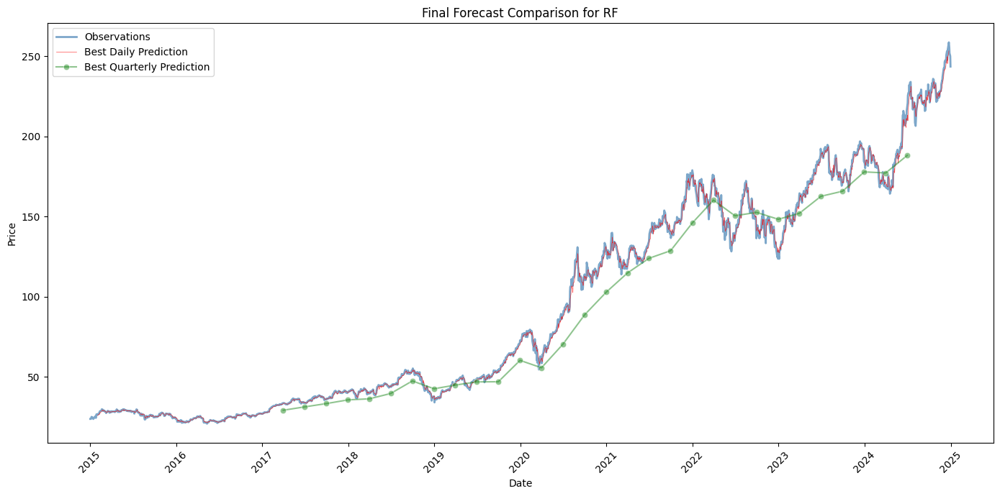

[INFO] Plotting SVM forecasts for AAPL...


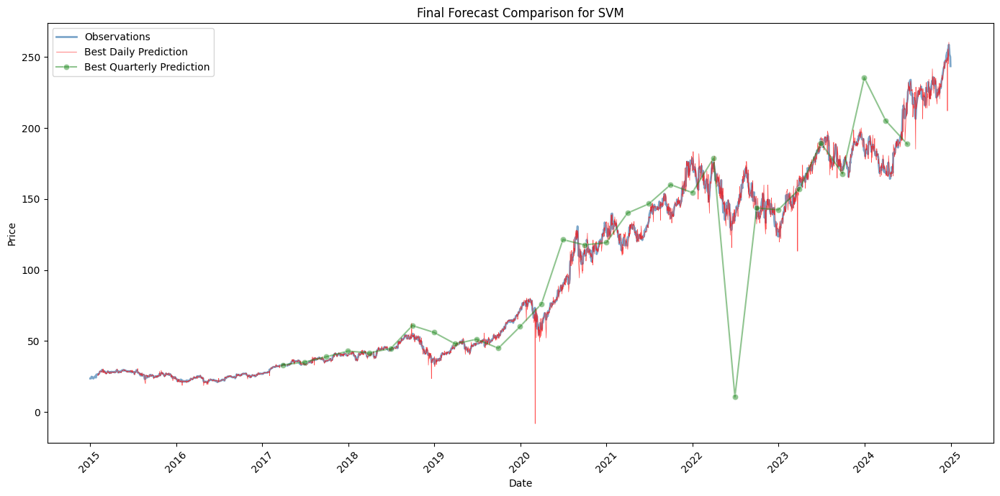

[INFO] Plotting GB forecasts for AAPL...


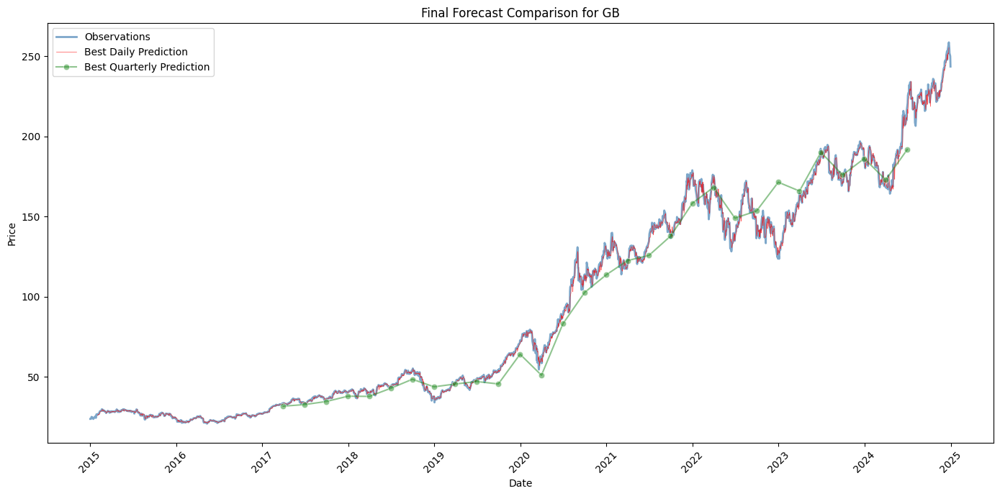

[INFO] Plotting RF forecasts for MSFT...


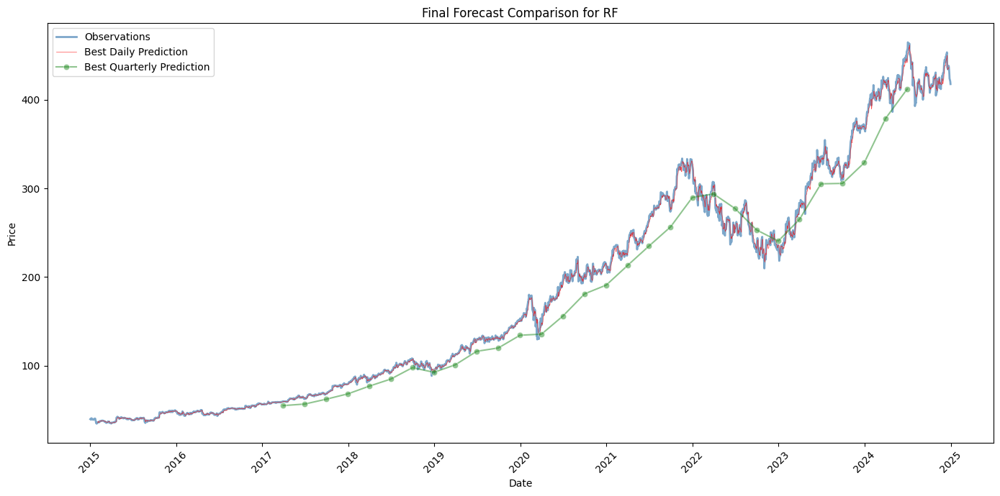

[INFO] Plotting SVM forecasts for MSFT...


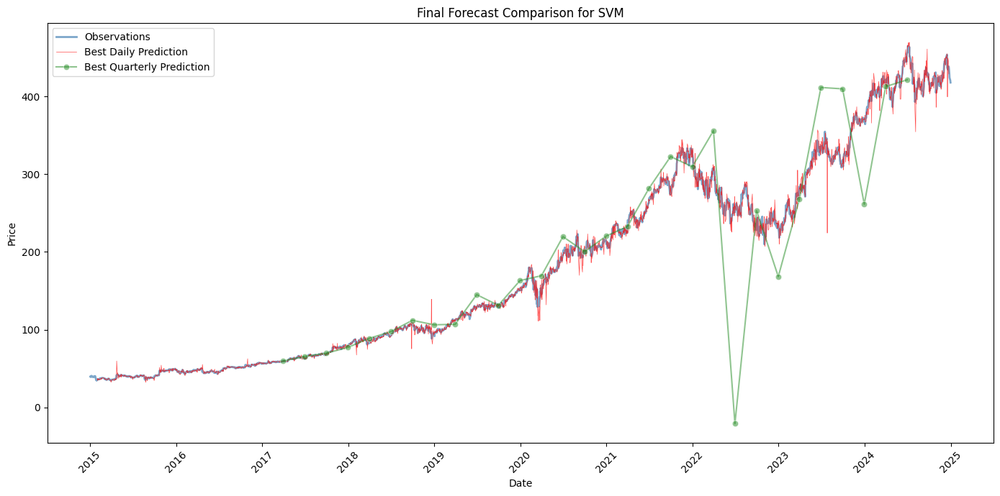

[INFO] Plotting GB forecasts for MSFT...


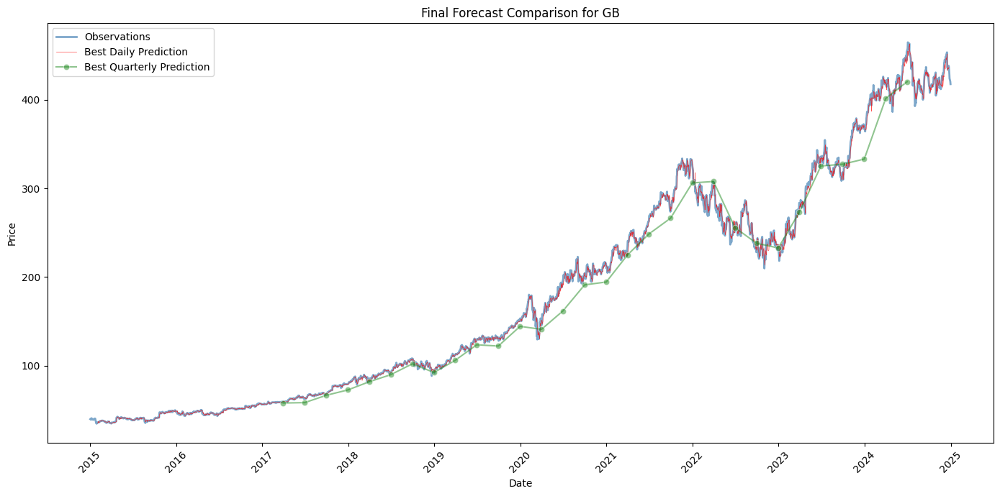

[INFO] Plotting RF forecasts for LLY...


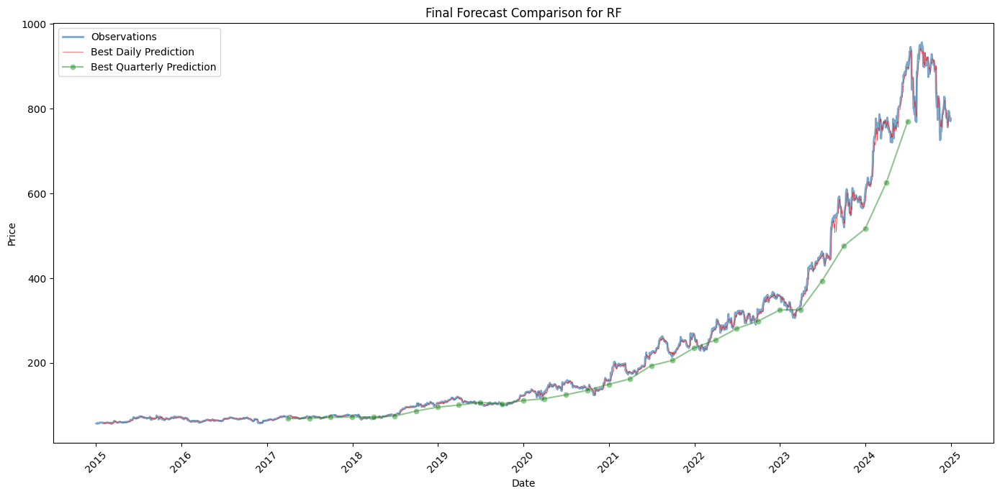

[INFO] Plotting SVM forecasts for LLY...


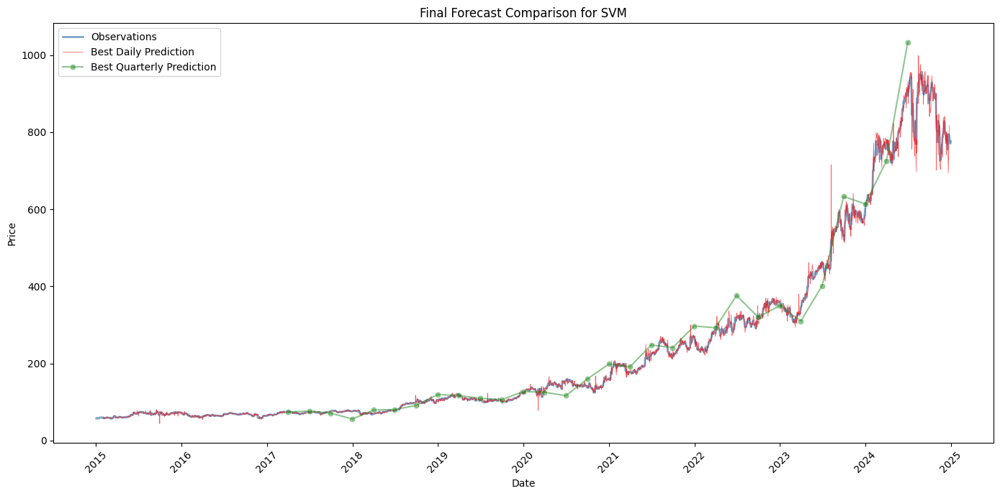

[INFO] Plotting GB forecasts for LLY...


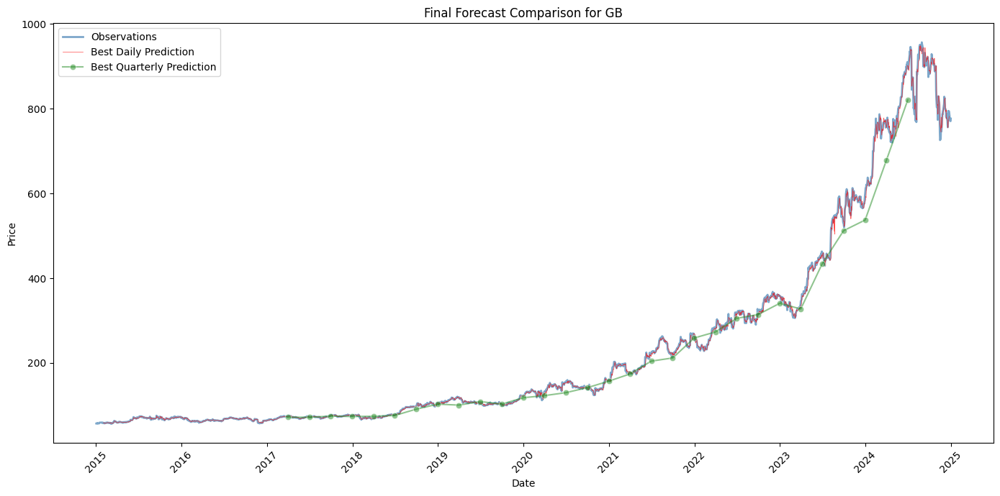

[INFO] Plotting RF forecasts for UNH...


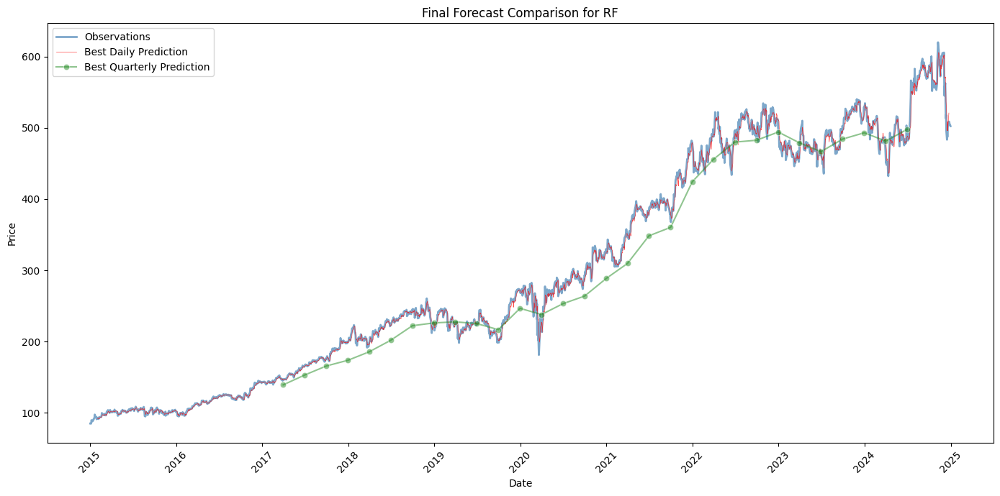

[INFO] Plotting SVM forecasts for UNH...


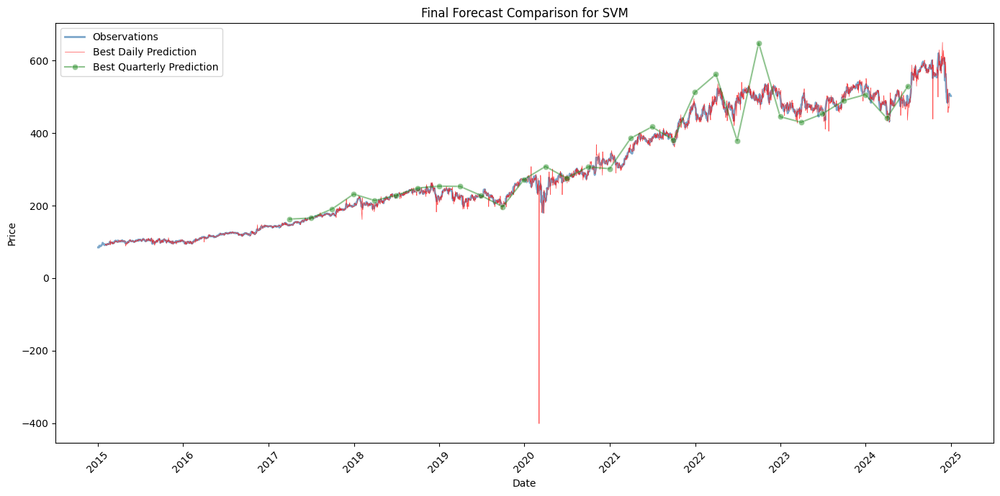

[INFO] Plotting GB forecasts for UNH...


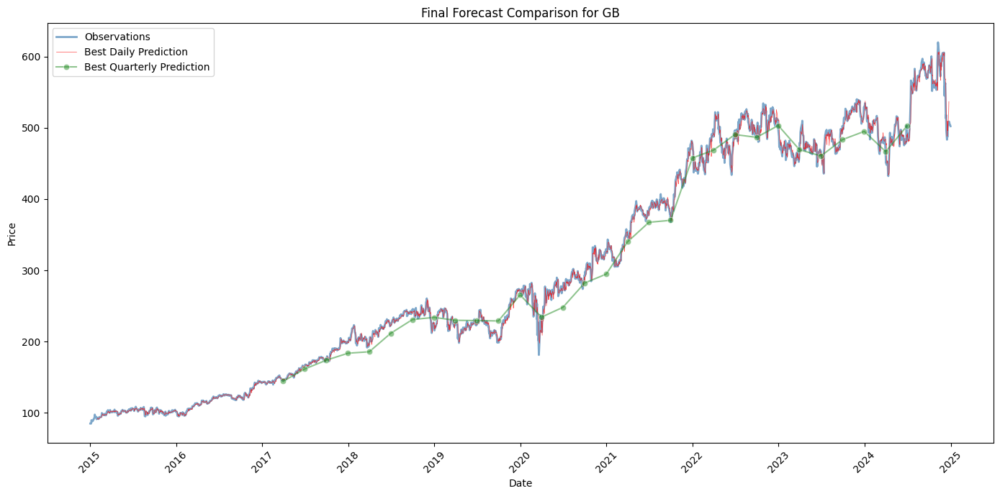

[INFO] Plotting RF forecasts for V...


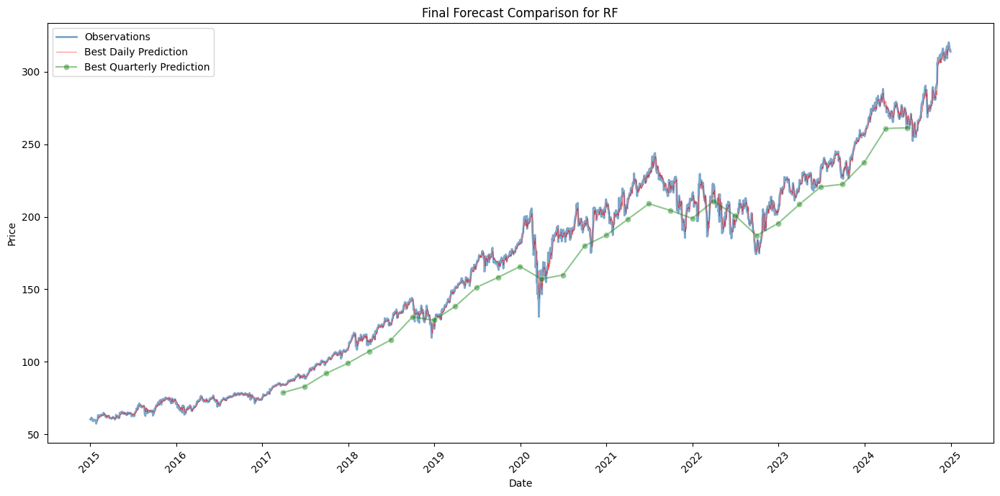

[INFO] Plotting SVM forecasts for V...


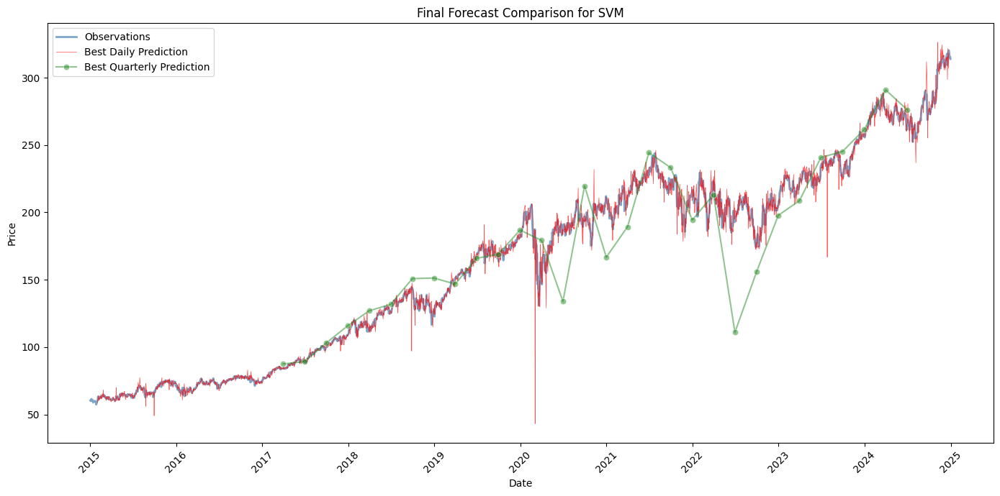

[INFO] Plotting GB forecasts for V...


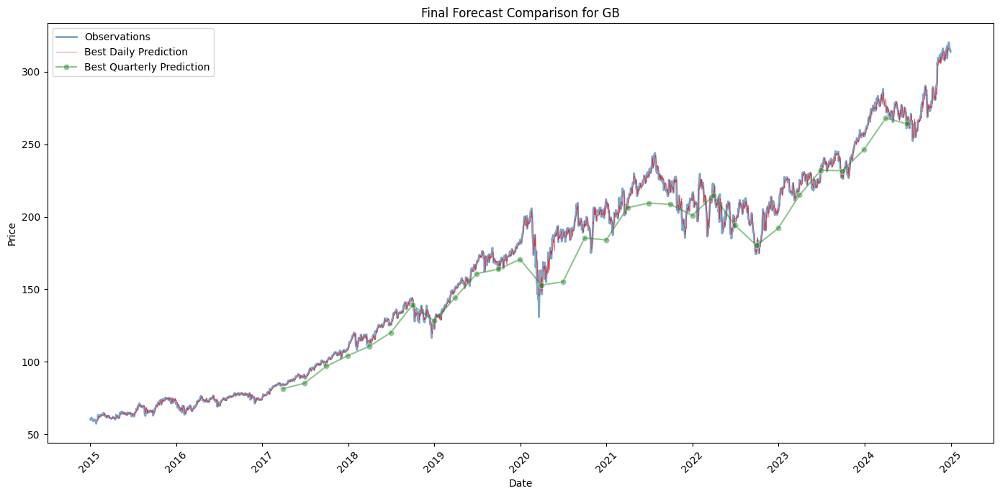

[INFO] Plotting RF forecasts for MA...


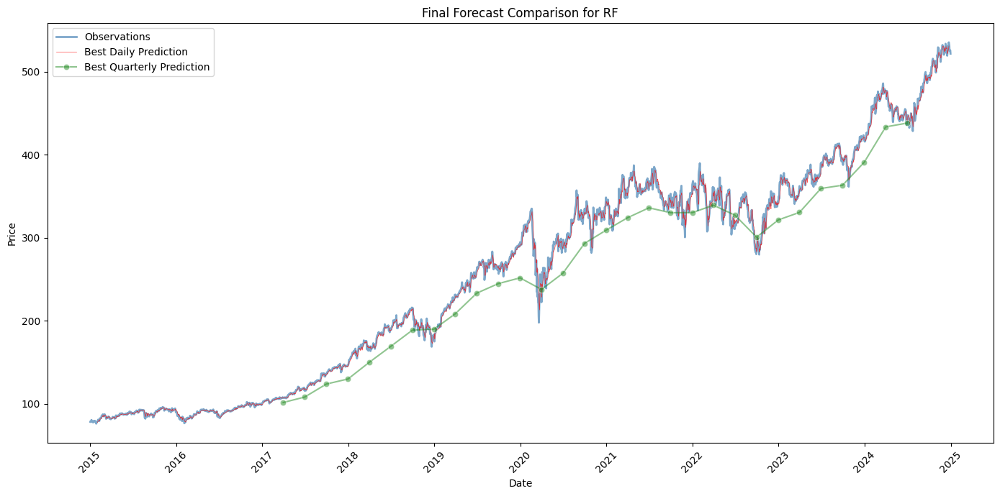

[INFO] Plotting SVM forecasts for MA...


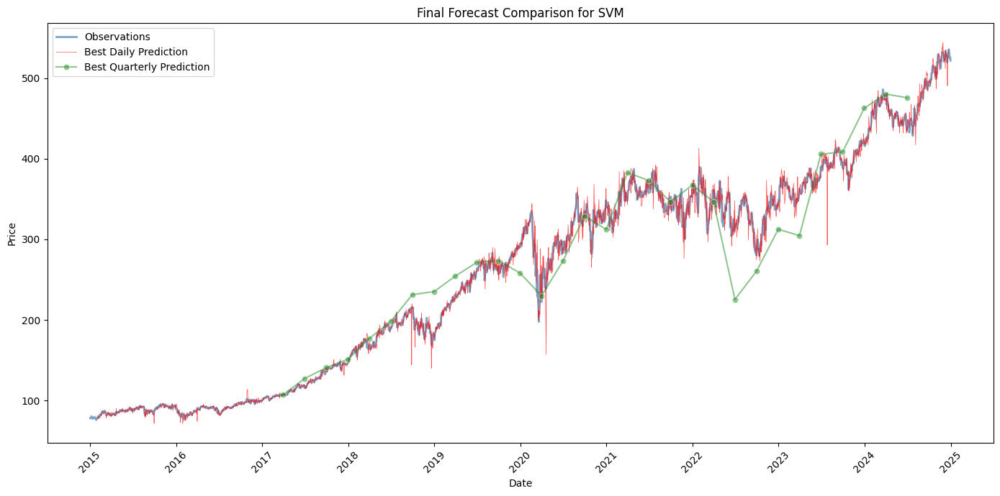

[INFO] Plotting GB forecasts for MA...


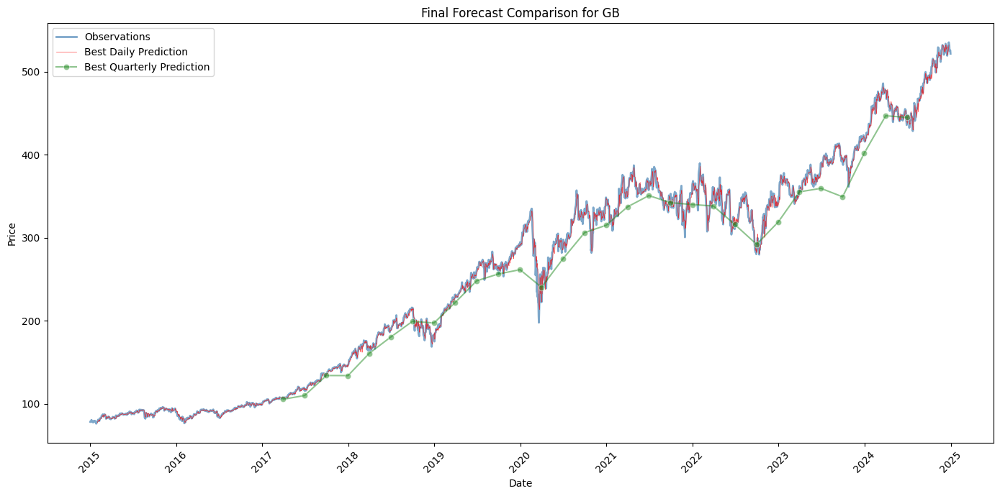

[INFO] Plotting RF forecasts for GOOGL...


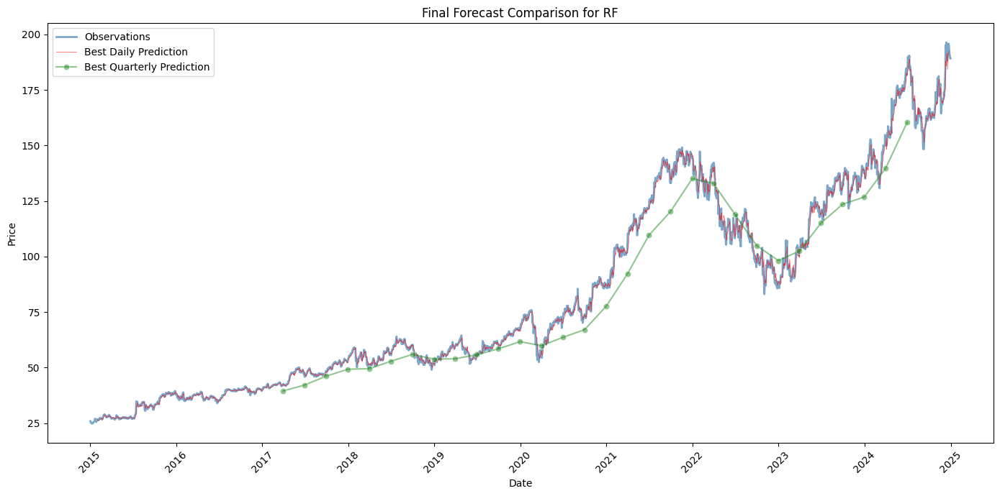

[INFO] Plotting SVM forecasts for GOOGL...


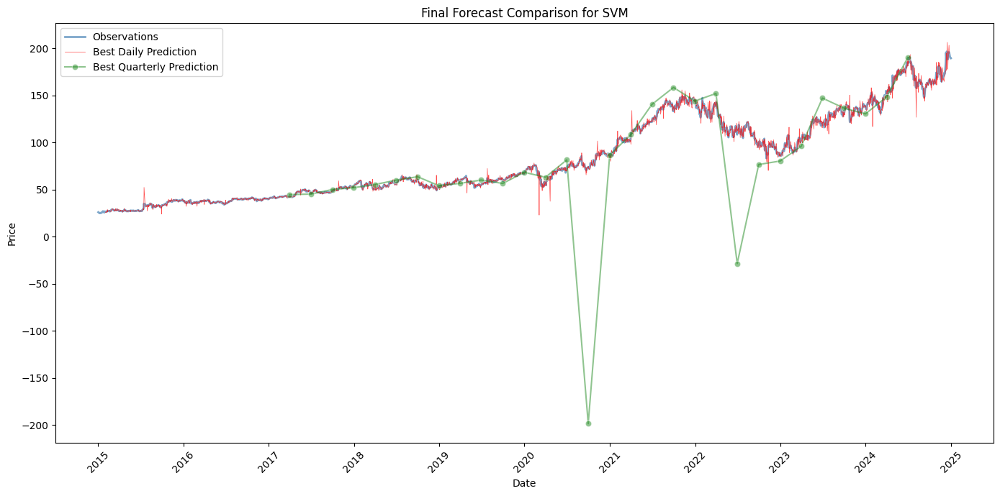

[INFO] Plotting GB forecasts for GOOGL...


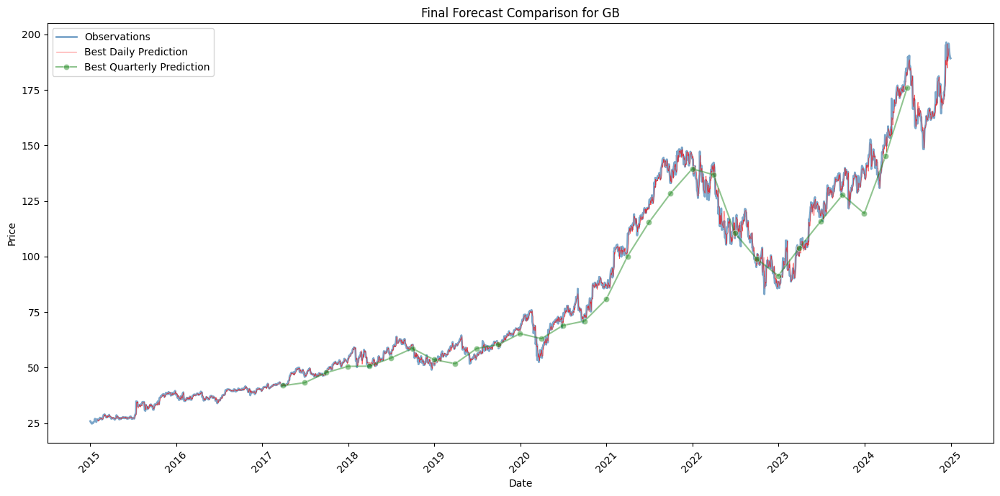

[INFO] Plotting RF forecasts for META...


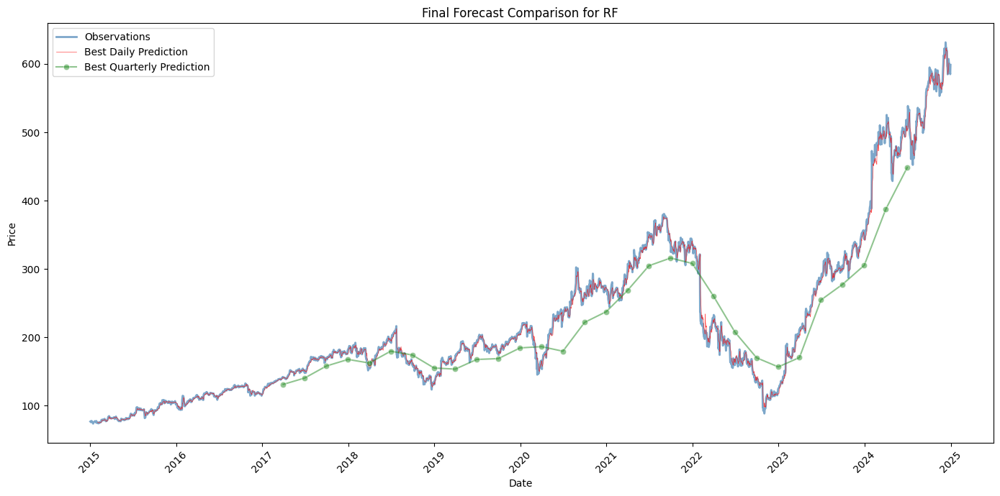

[INFO] Plotting SVM forecasts for META...


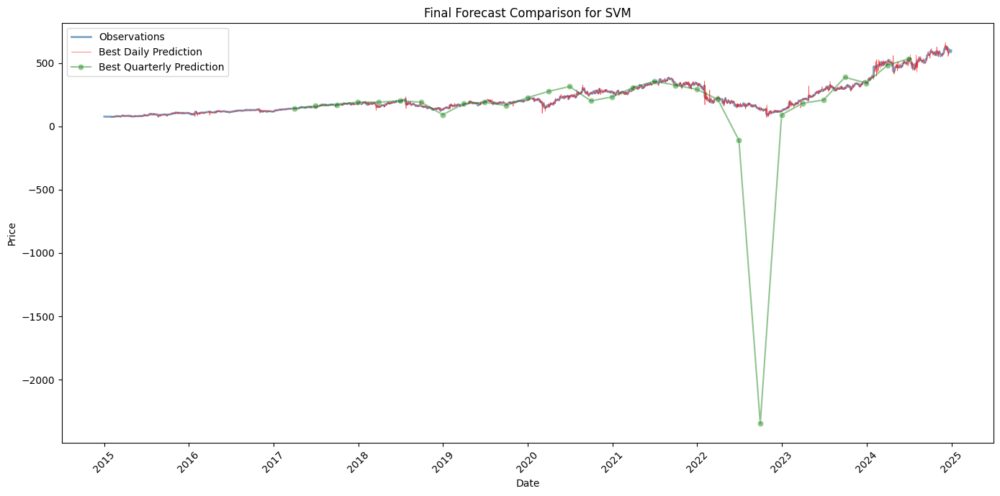

[INFO] Plotting GB forecasts for META...


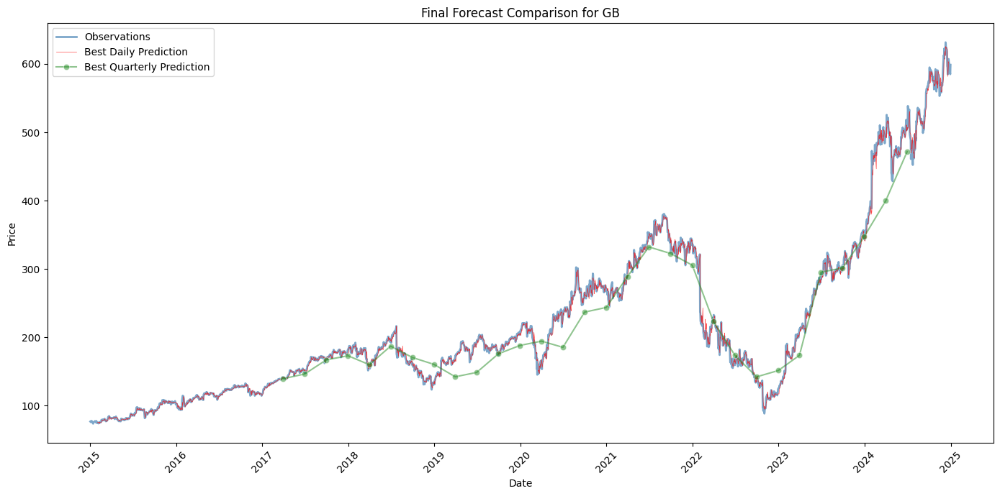

[INFO] Plotting RF forecasts for AMZN...


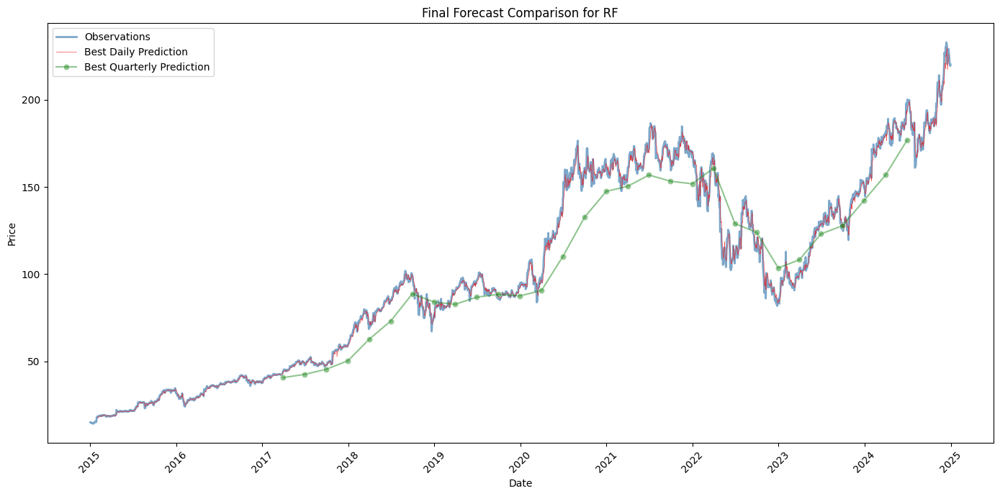

[INFO] Plotting SVM forecasts for AMZN...


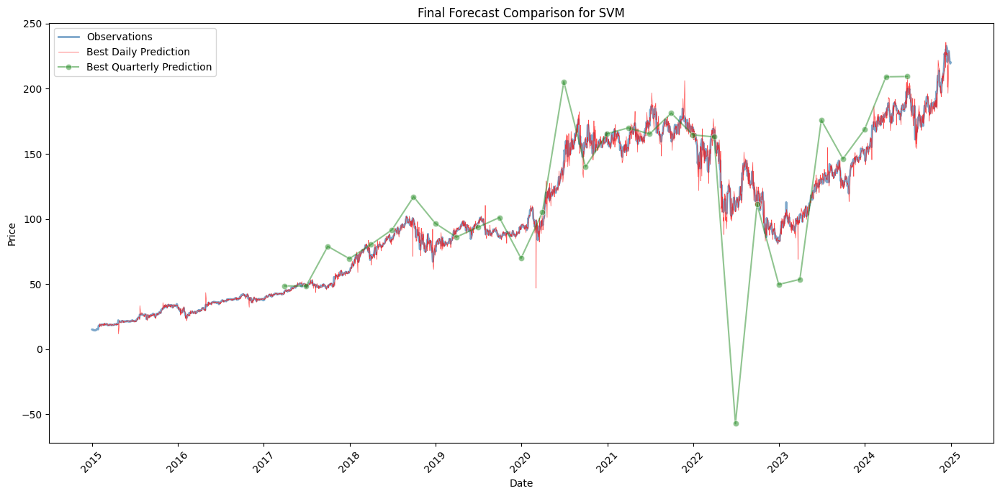

[INFO] Plotting GB forecasts for AMZN...


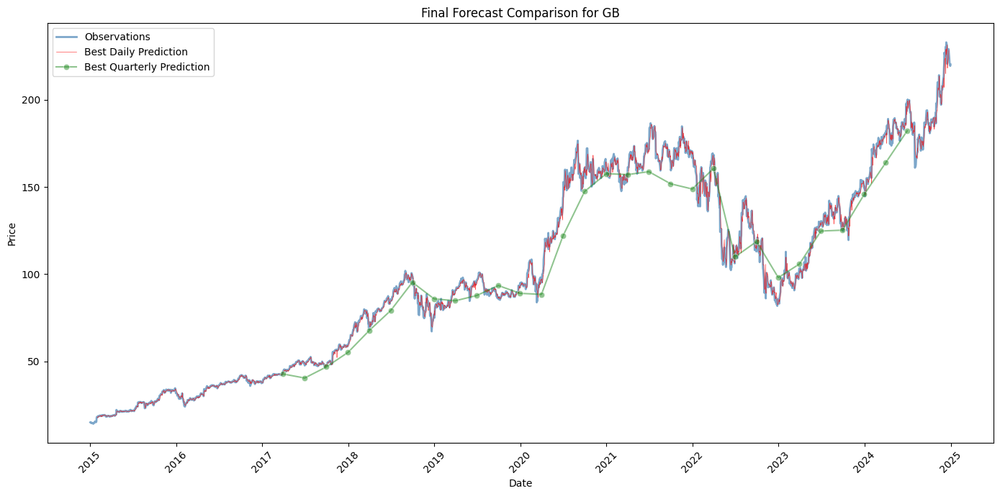

[INFO] Plotting RF forecasts for TSLA...


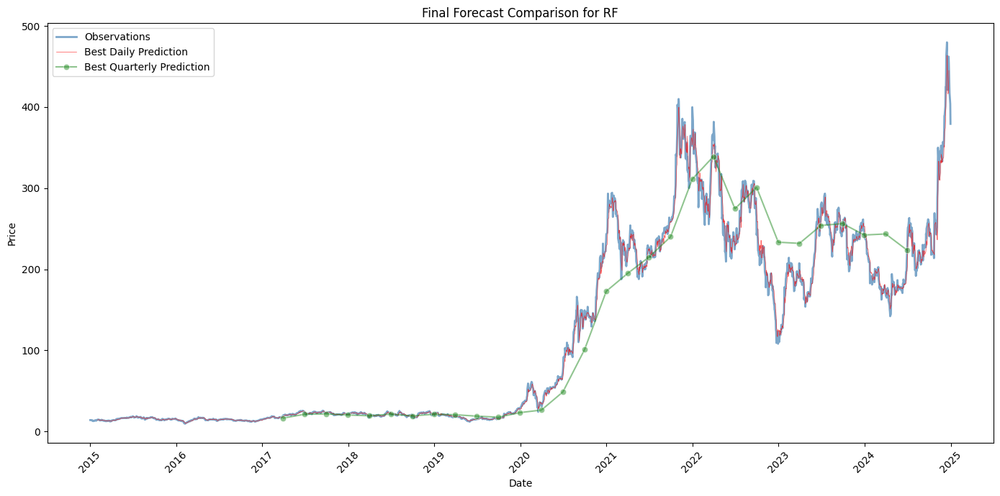

[INFO] Plotting SVM forecasts for TSLA...


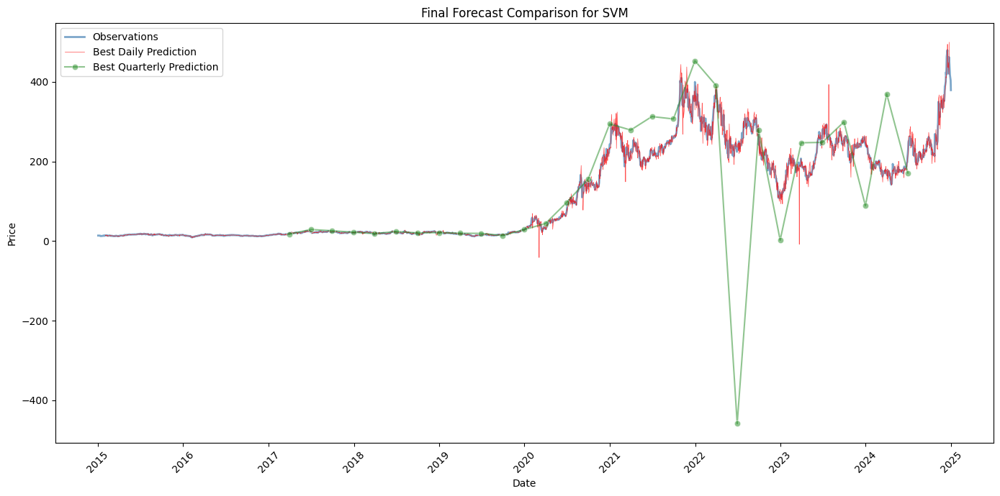

[INFO] Plotting GB forecasts for TSLA...


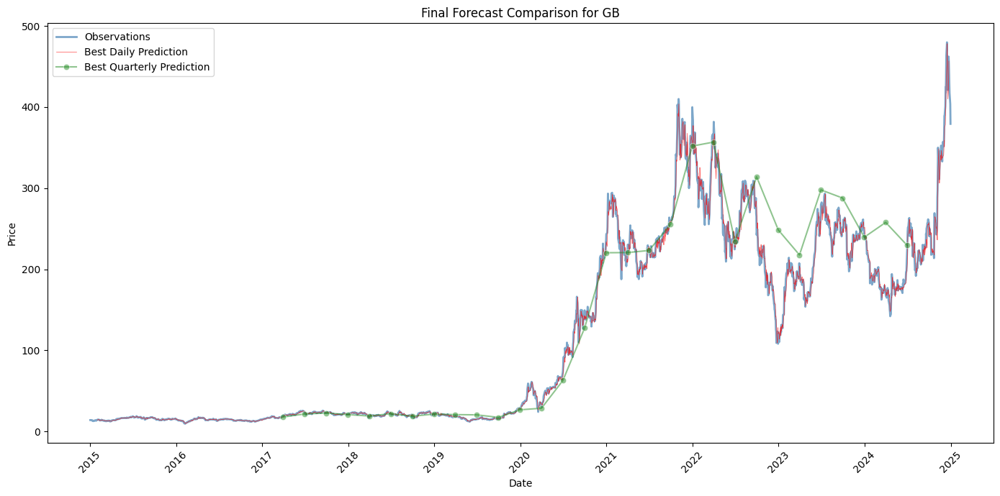

[INFO] Plotting RF forecasts for PG...


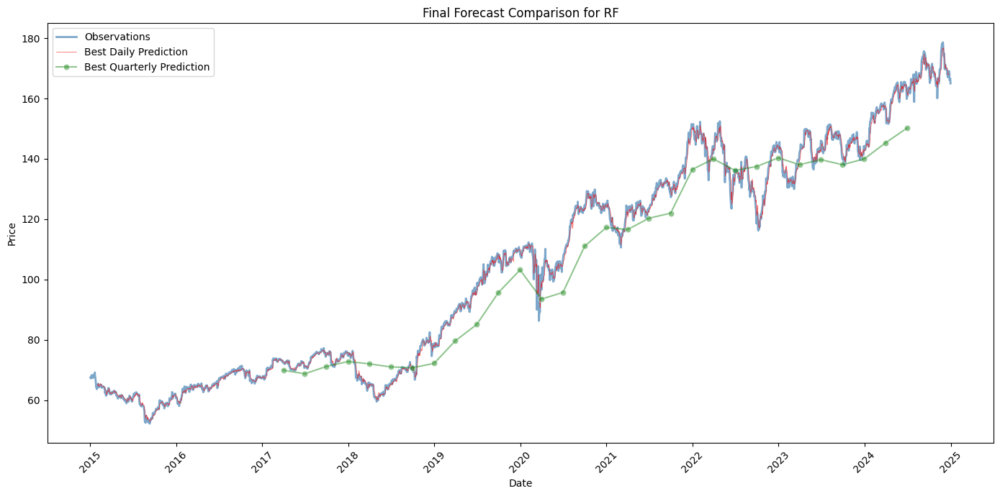

[INFO] Plotting SVM forecasts for PG...


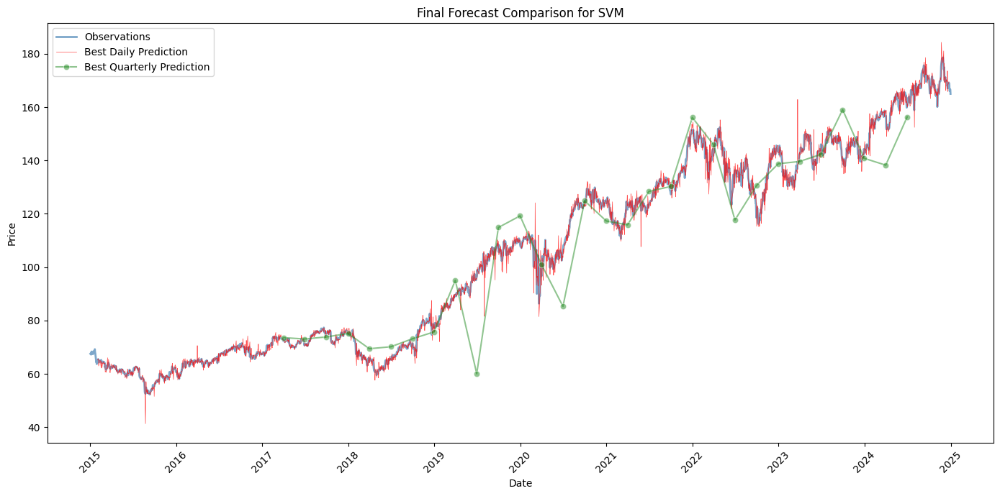

[INFO] Plotting GB forecasts for PG...


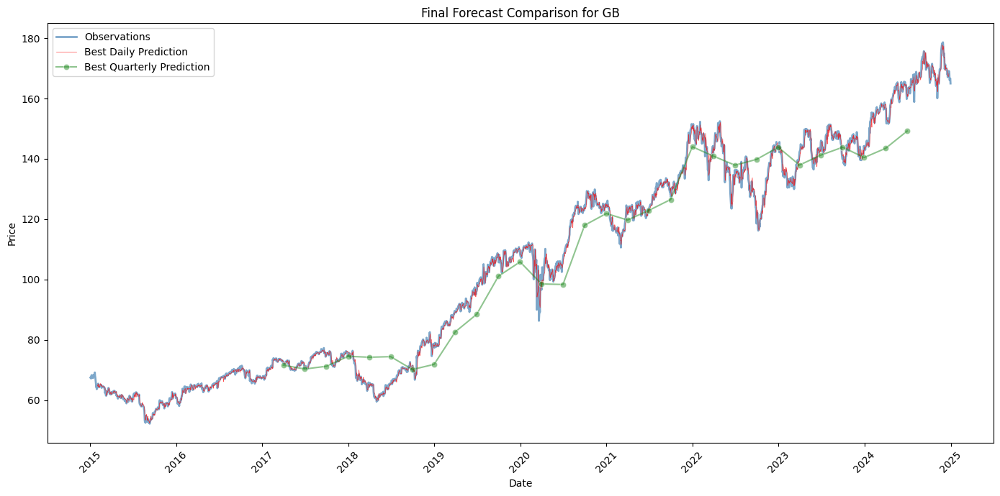

[INFO] Plotting RF forecasts for WMT...


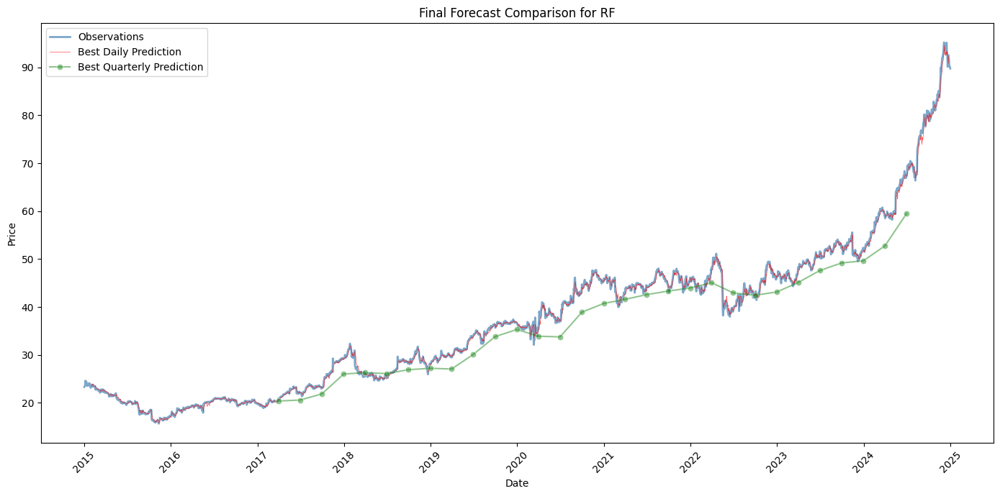

[INFO] Plotting SVM forecasts for WMT...


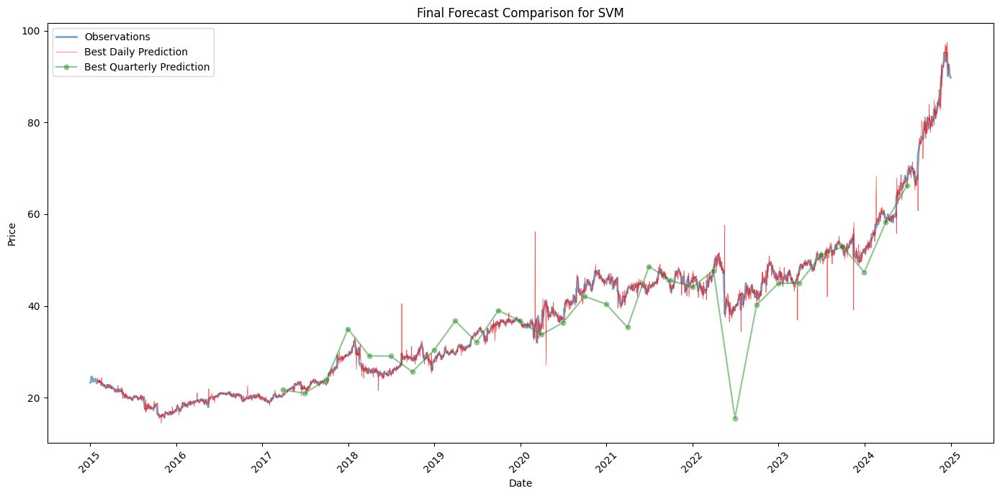

[INFO] Plotting GB forecasts for WMT...


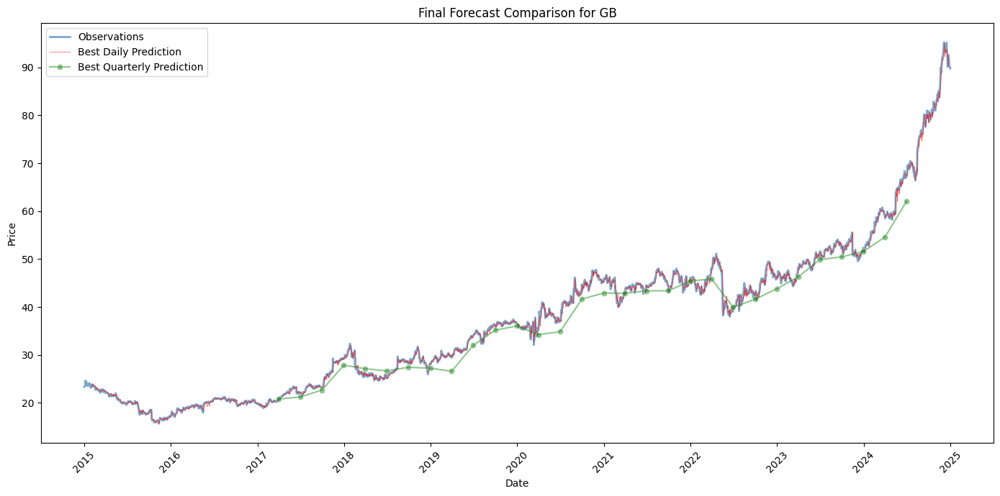

[INFO] Plotting RF forecasts for RTX...


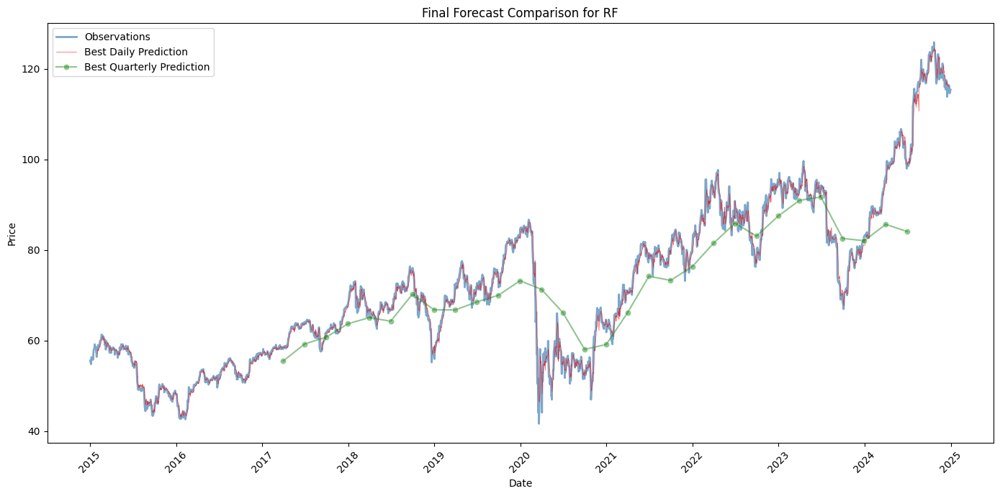

[INFO] Plotting SVM forecasts for RTX...


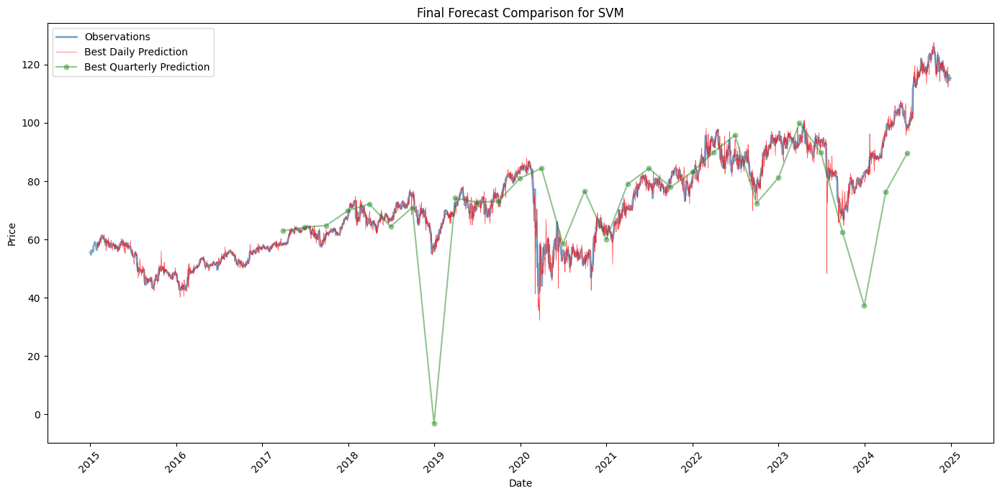

[INFO] Plotting GB forecasts for RTX...


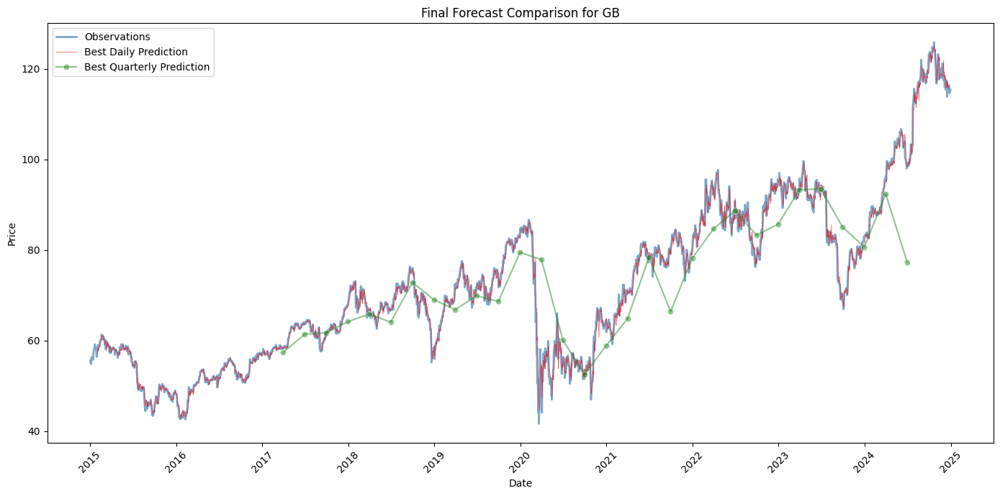

[INFO] Plotting RF forecasts for UNP...


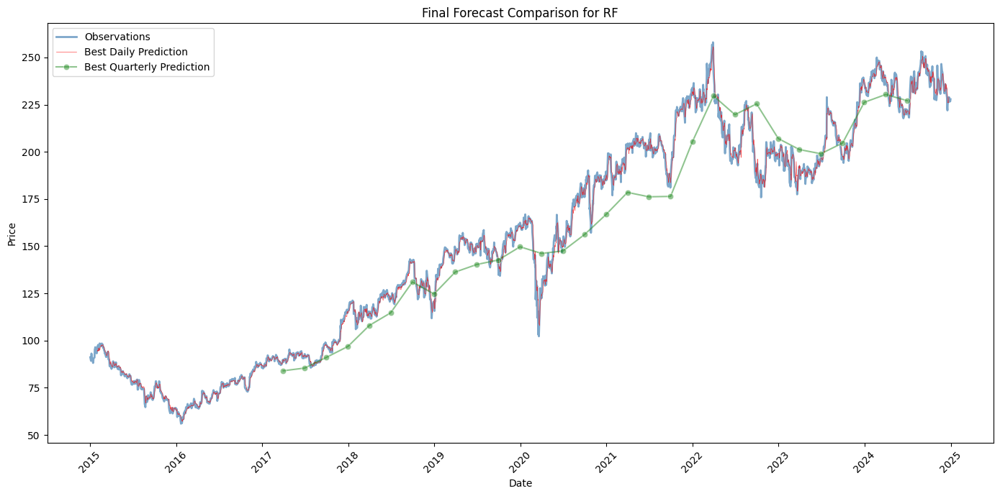

[INFO] Plotting SVM forecasts for UNP...


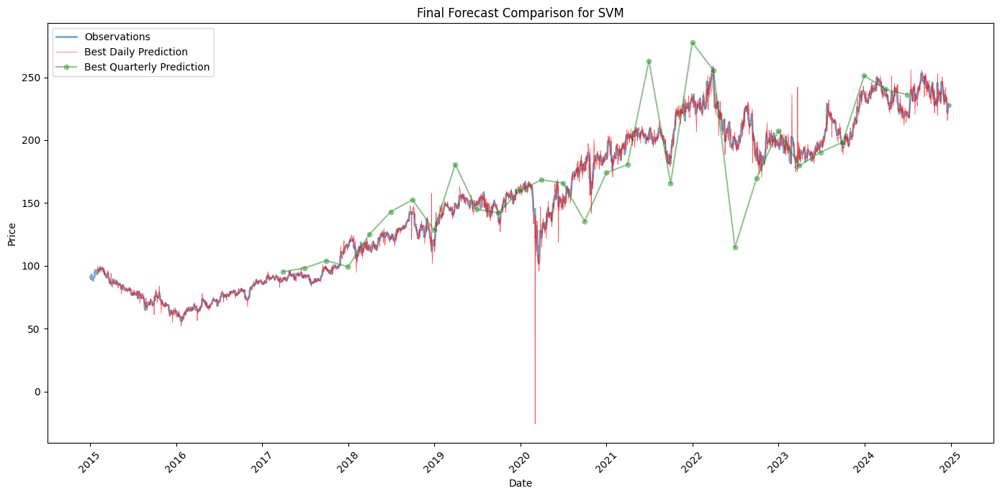

[INFO] Plotting GB forecasts for UNP...


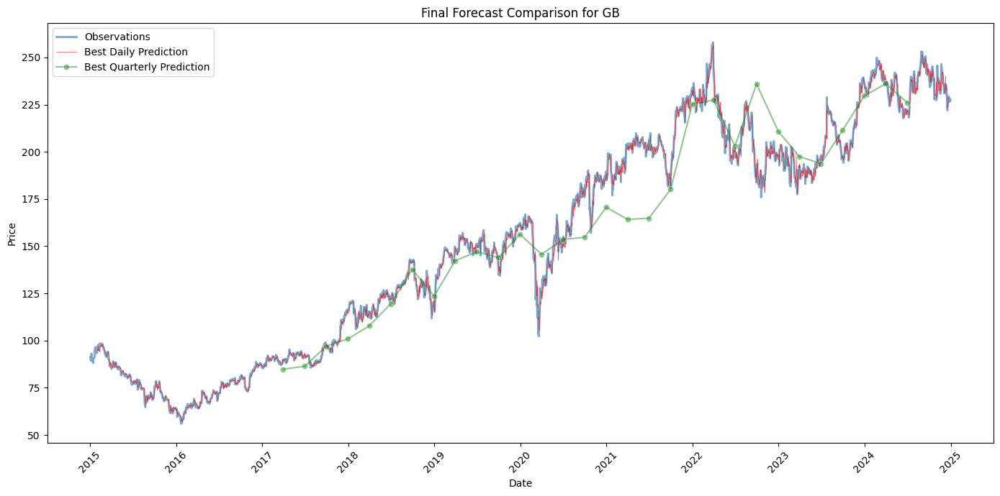

[INFO] Plotting RF forecasts for XOM...


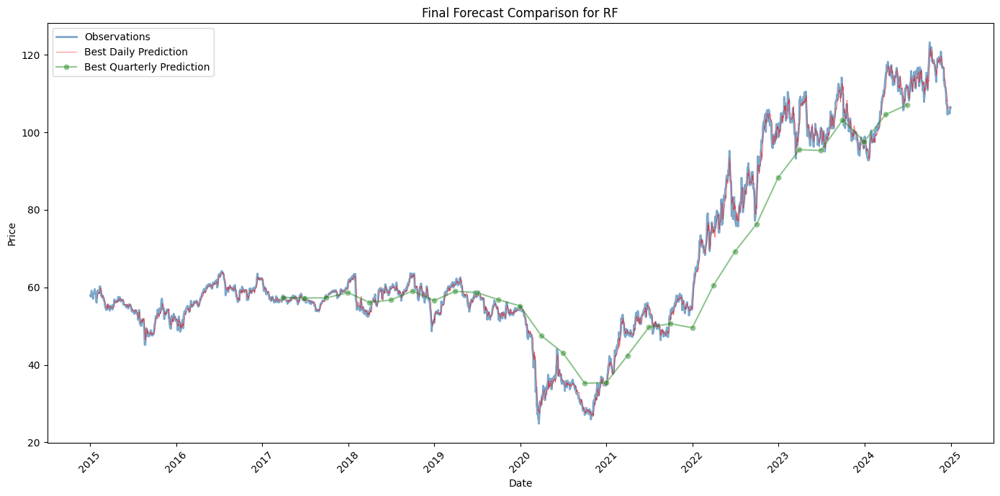

[INFO] Plotting SVM forecasts for XOM...


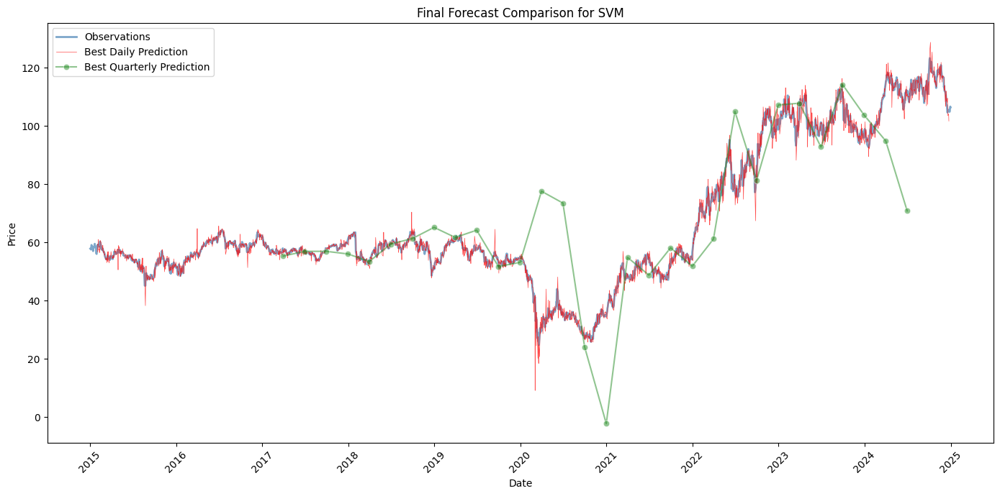

[INFO] Plotting GB forecasts for XOM...


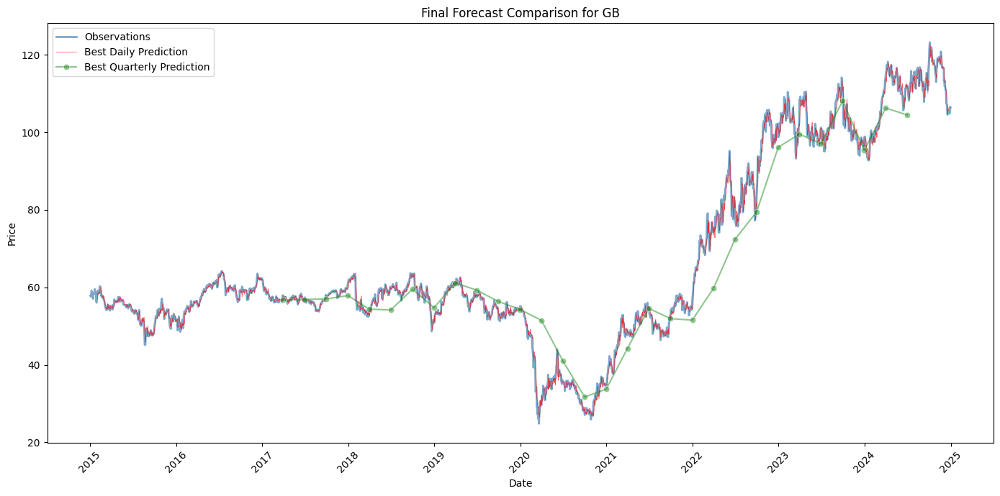

[INFO] Plotting RF forecasts for CVX...


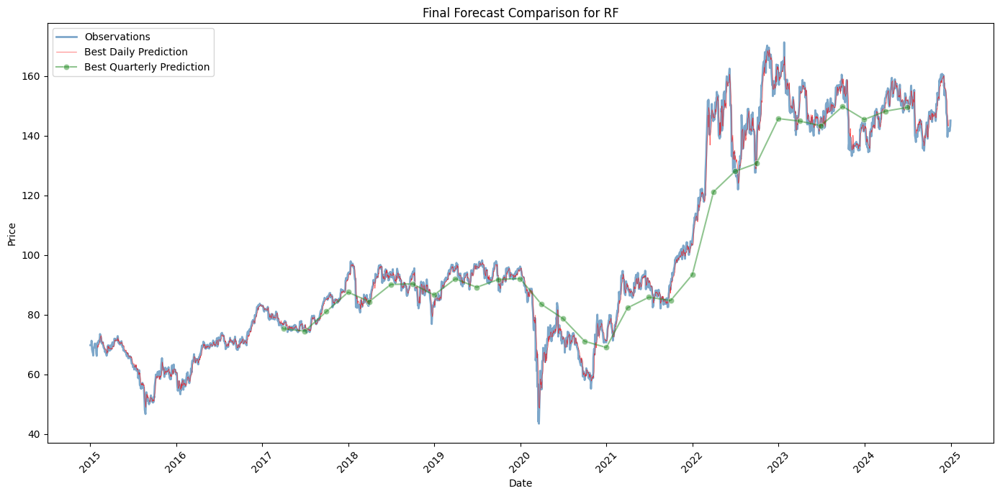

[INFO] Plotting SVM forecasts for CVX...


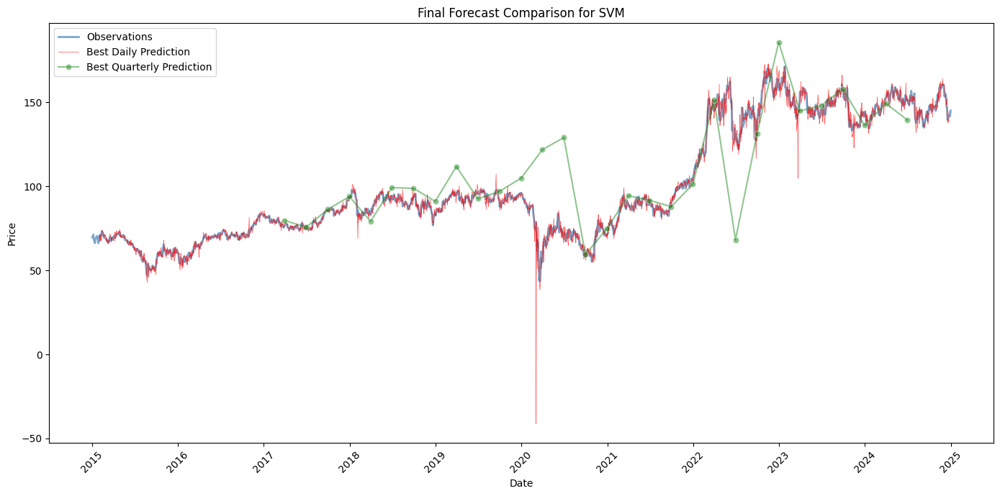

[INFO] Plotting GB forecasts for CVX...


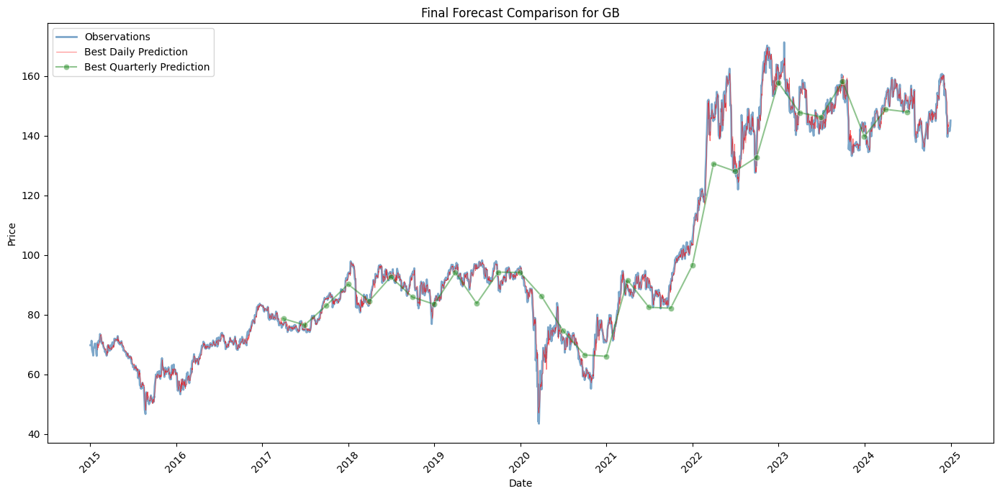

[INFO] Plotting RF forecasts for LIN...


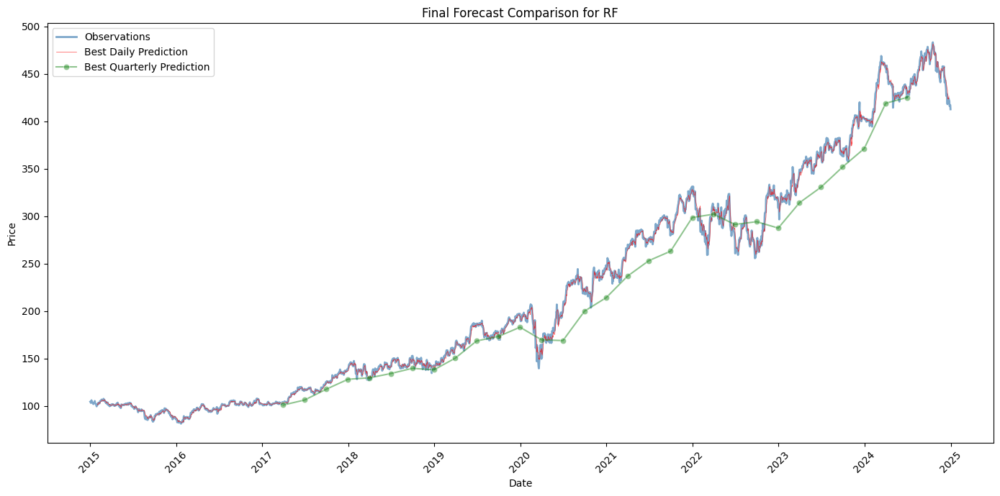

[INFO] Plotting SVM forecasts for LIN...


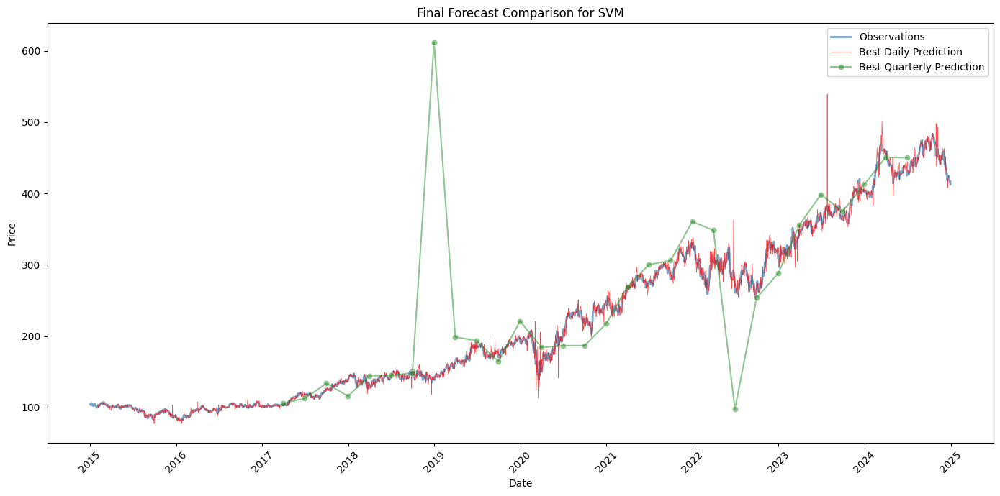

[INFO] Plotting GB forecasts for LIN...


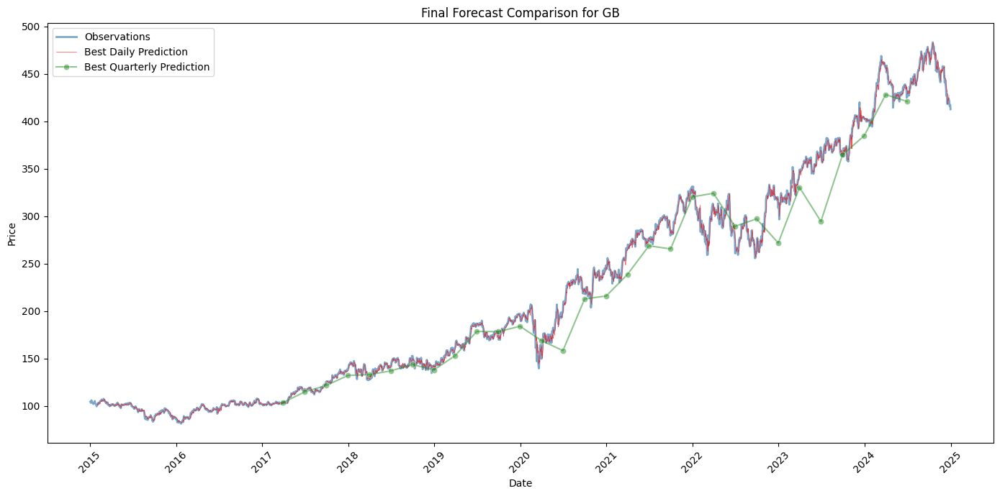

[INFO] Plotting RF forecasts for SHW...


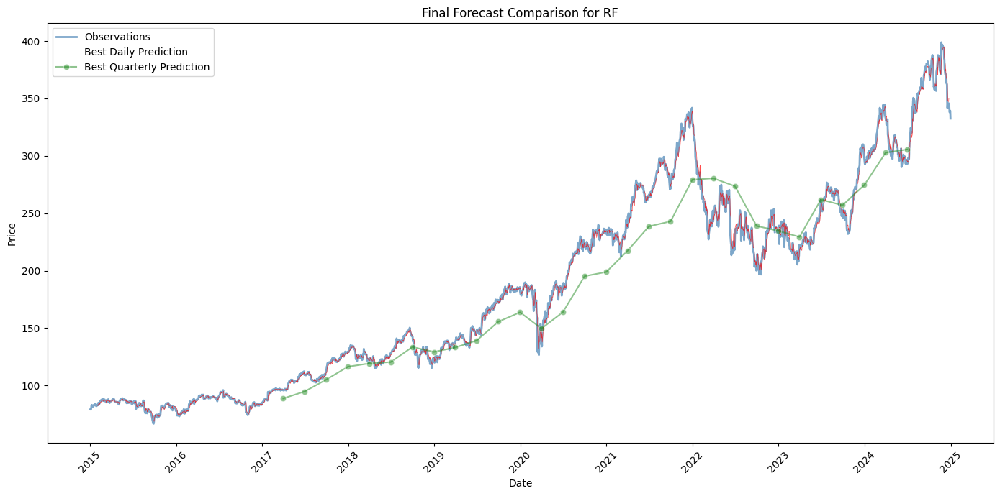

[INFO] Plotting SVM forecasts for SHW...


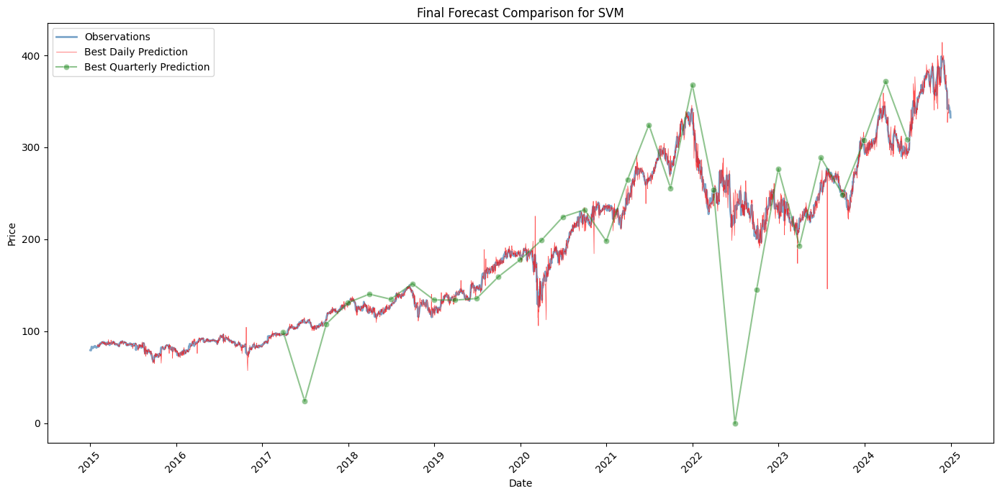

[INFO] Plotting GB forecasts for SHW...


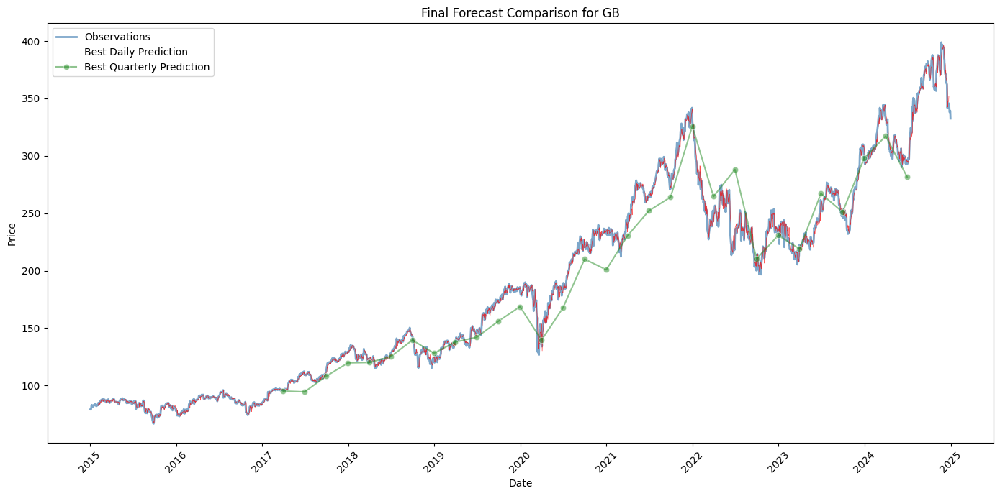

[INFO] Plotting RF forecasts for AMT...


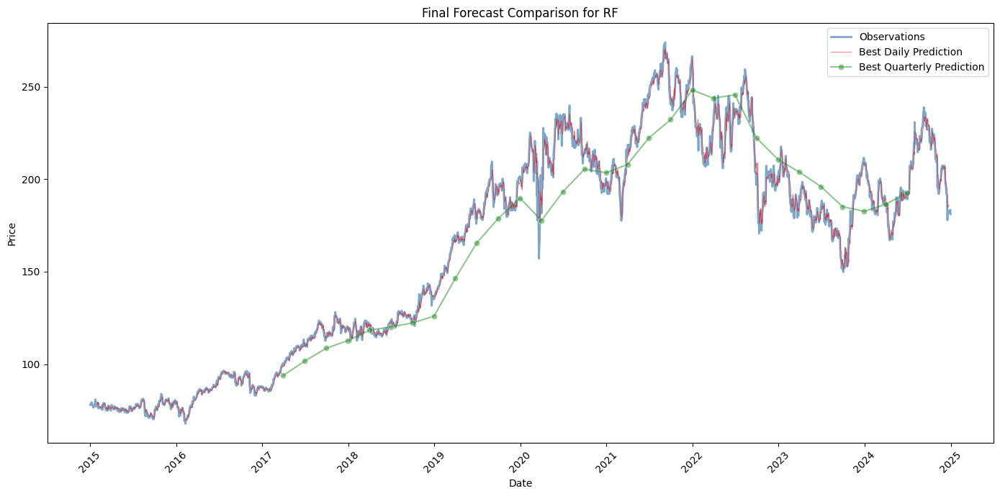

[INFO] Plotting SVM forecasts for AMT...


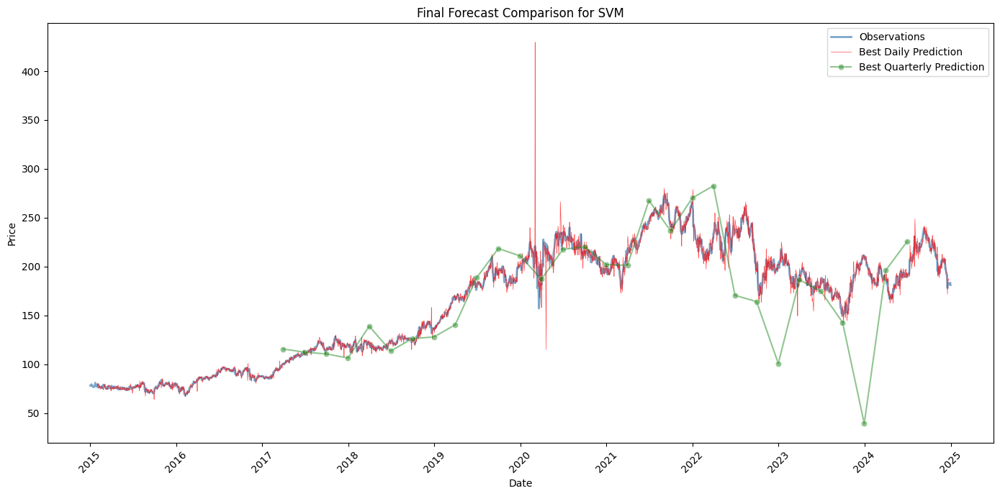

[INFO] Plotting GB forecasts for AMT...


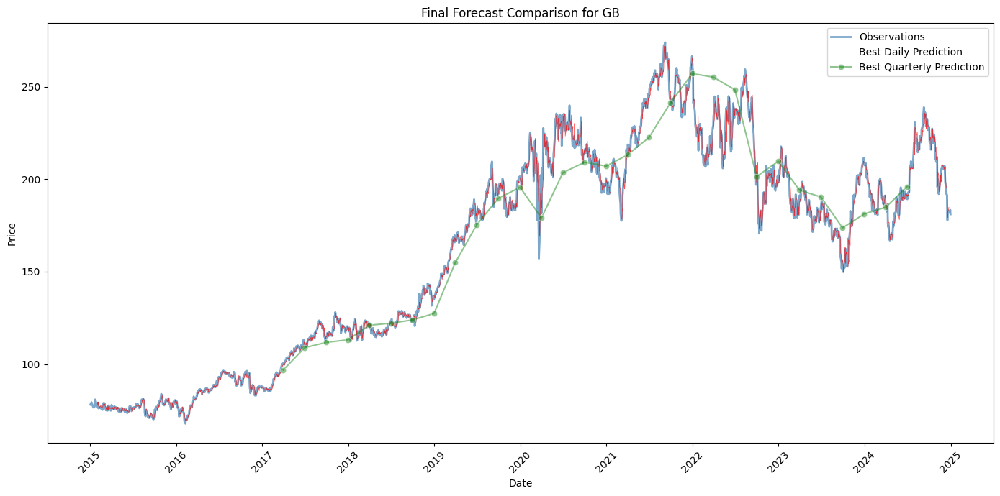

[INFO] Plotting RF forecasts for PLD...


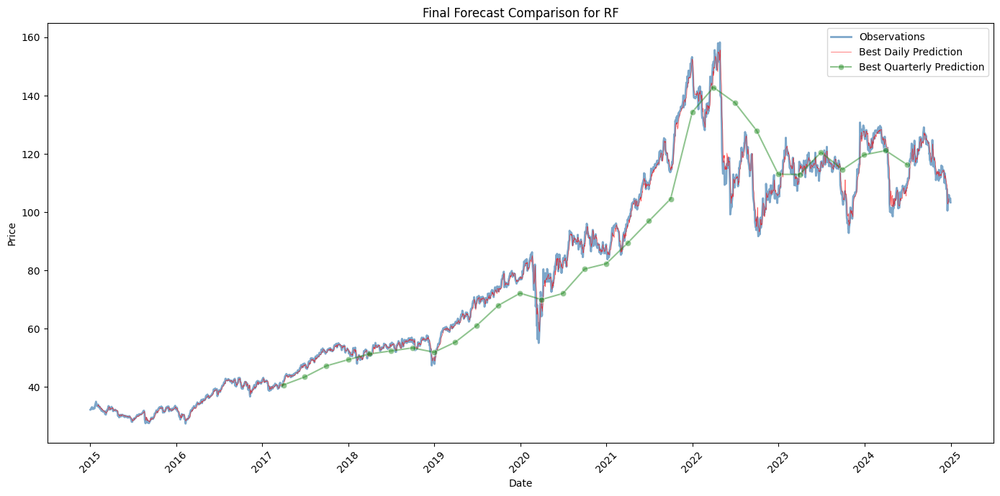

[INFO] Plotting SVM forecasts for PLD...


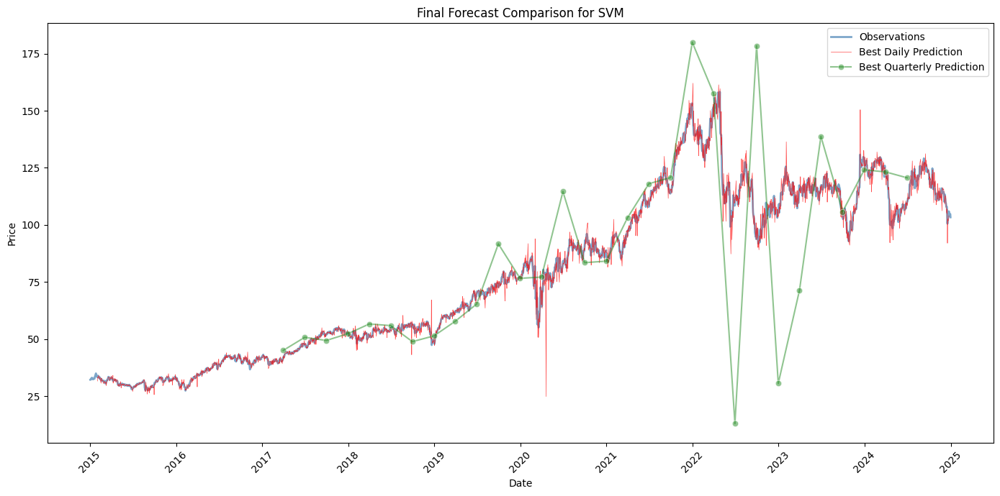

[INFO] Plotting GB forecasts for PLD...


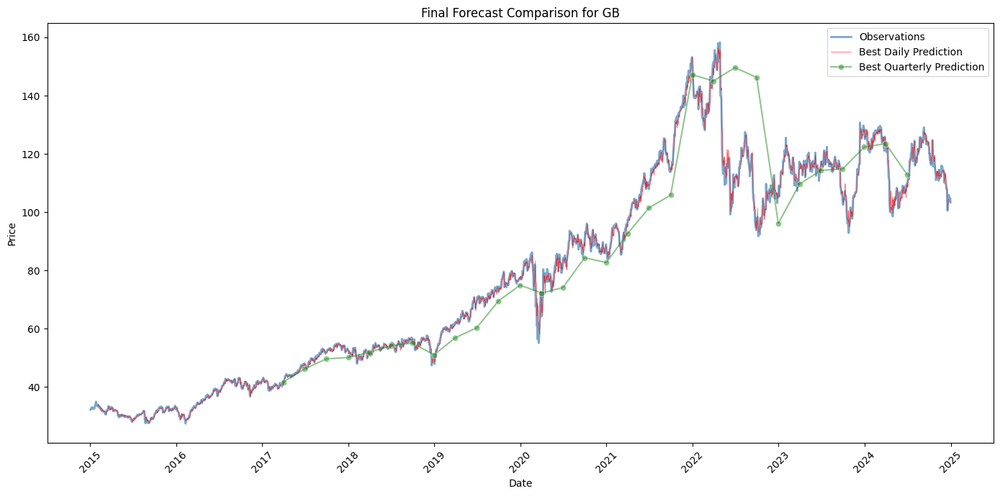

[INFO] Plotting RF forecasts for NEE...


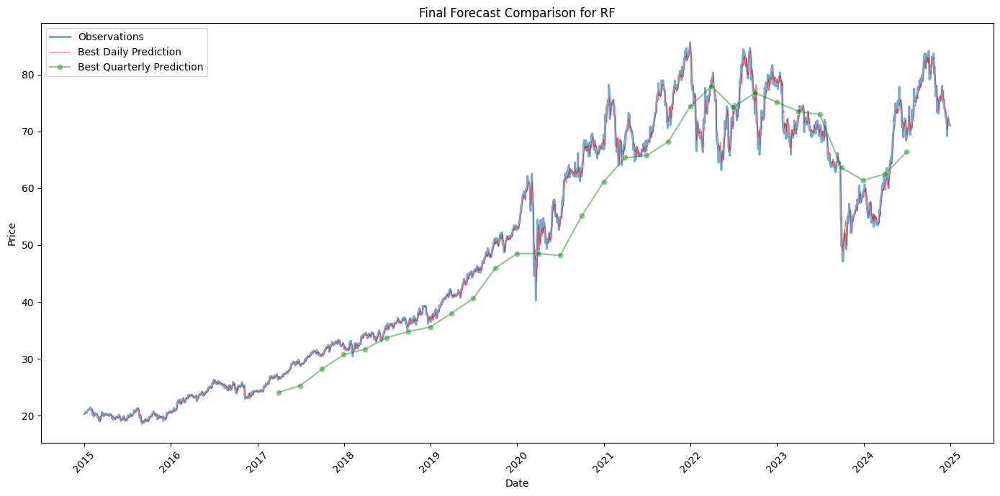

[INFO] Plotting SVM forecasts for NEE...


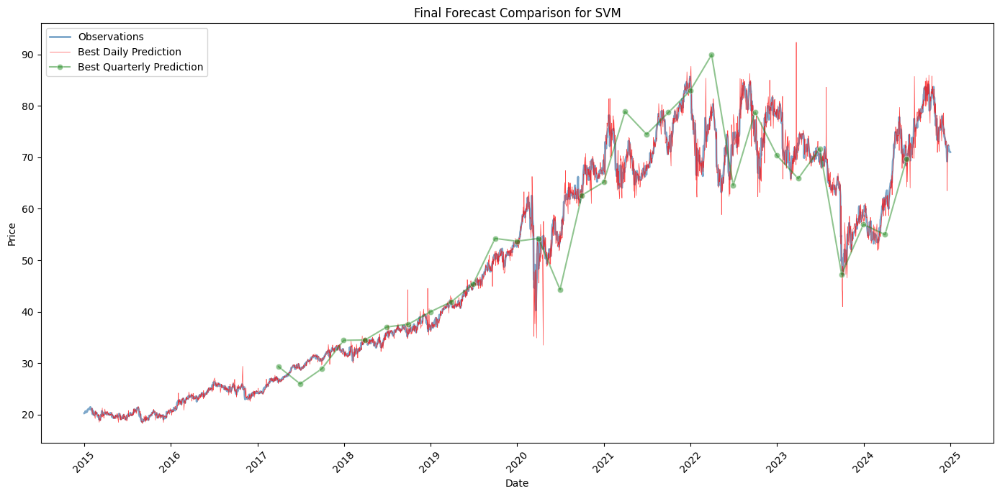

[INFO] Plotting GB forecasts for NEE...


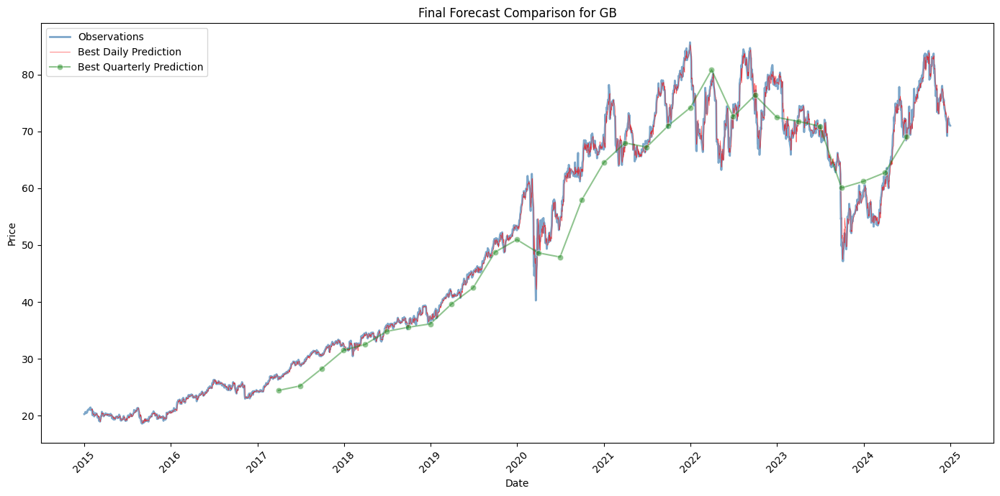

[INFO] Plotting RF forecasts for SO...


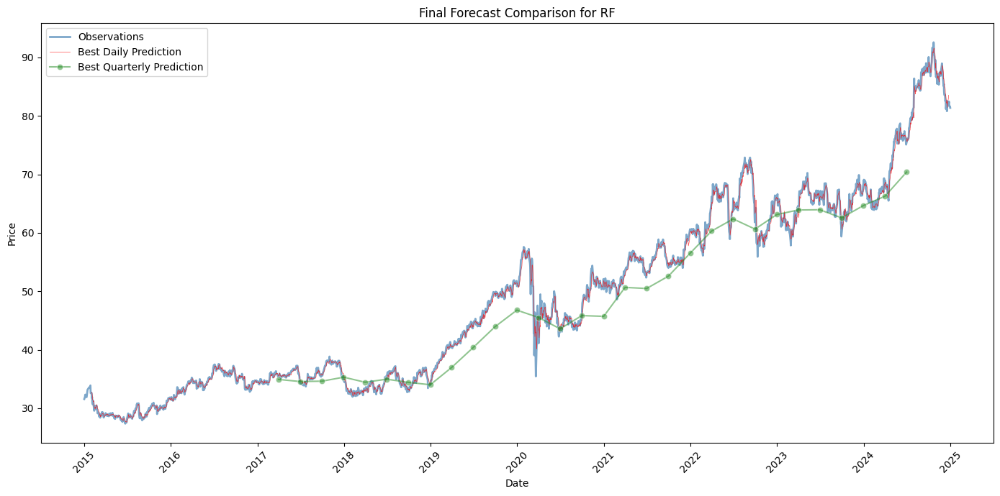

[INFO] Plotting SVM forecasts for SO...


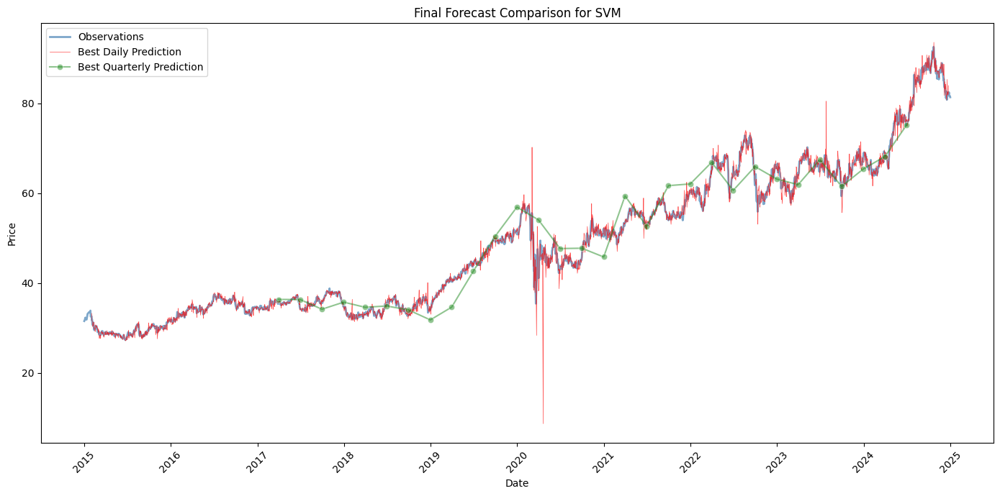

[INFO] Plotting GB forecasts for SO...


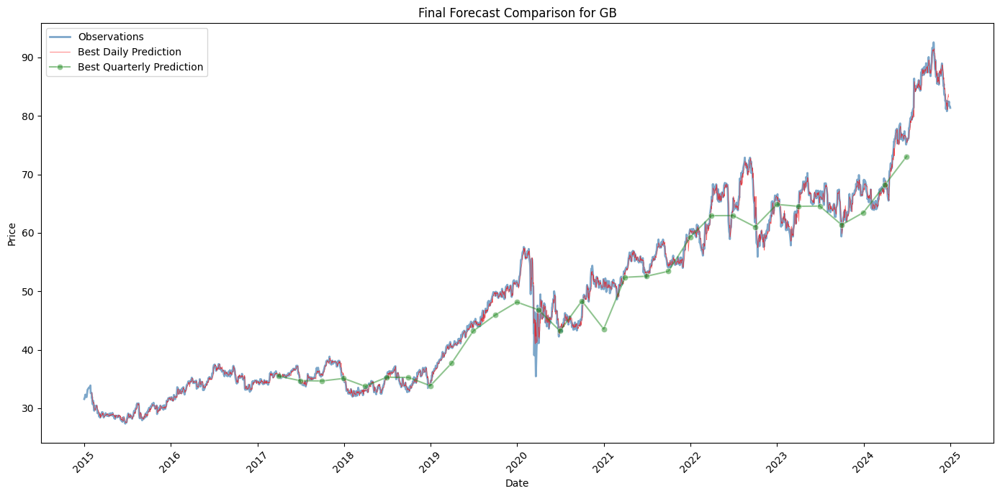

[INFO] Plotting RF forecasts for ^GSPC...


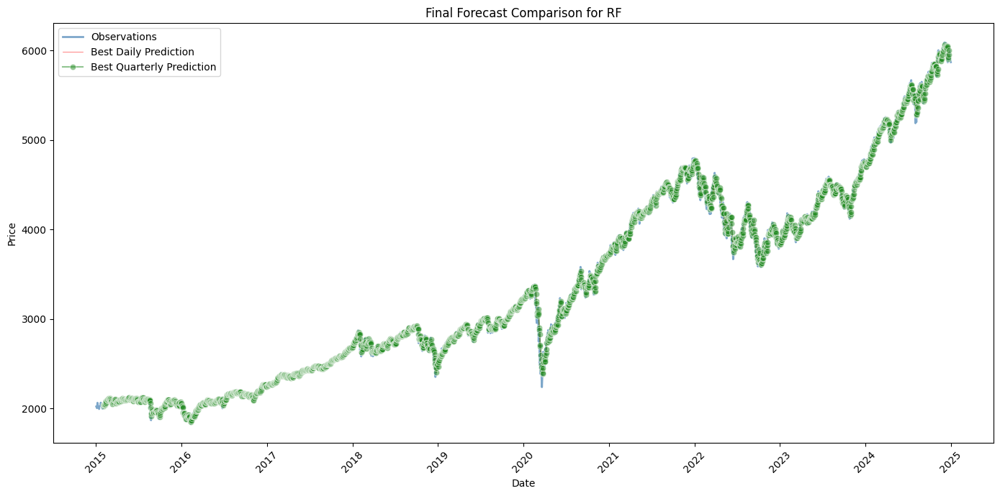

[INFO] Plotting SVM forecasts for ^GSPC...


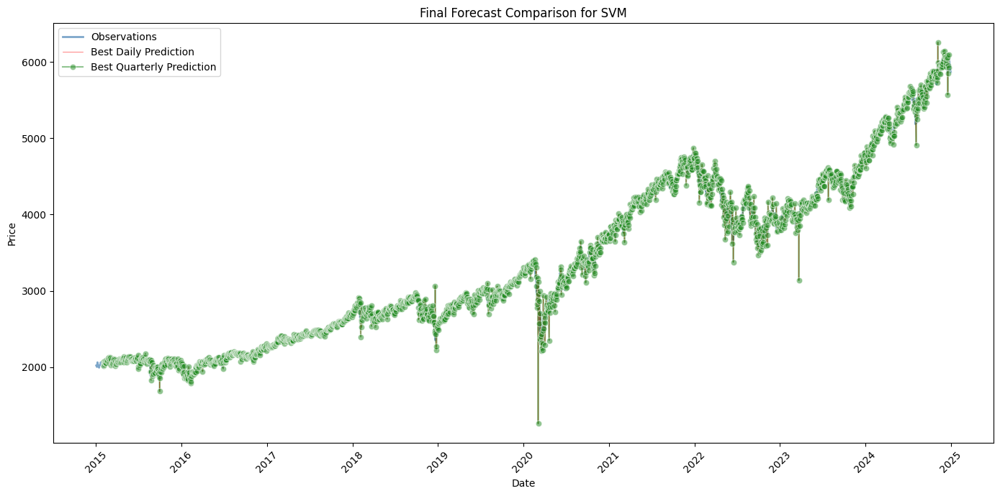

[INFO] Plotting GB forecasts for ^GSPC...


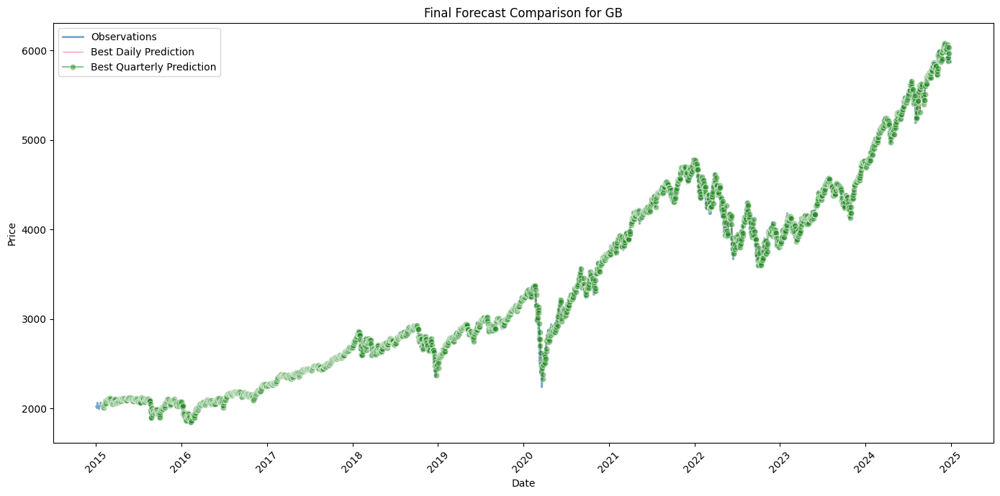

In [ ]:
def get_preds_from_log(ticker, domain_label, model_type, full_df):
    log_filename = f"{model_type}_{domain_label}_{ticker}_full.csv"
    log_dir = f"temp_logs_{domain_label}"
    log_path = os.path.join(log_dir, log_filename)
    if not os.path.exists(log_path):
        print(f"[ERROR] Log file not found for {ticker} {domain_label} {model_type}")
        return None
    log_df = pd.read_csv(log_path)
    first_preds, _ = aggregate_predictions(log_df, full_df)
    pred_series = series_from_dict(first_preds)
    # Normalize the index to just the date (rounding to midnight)
    pred_series.index = pd.to_datetime(pred_series.index).normalize()
    return pred_series

for ticker in daily_data_dict.keys():
    try:
        for m in MODEL_TYPES:
            print(f"[INFO] Plotting {m} forecasts for {ticker}...")

            # Get daily predictions and ensure the index is normalized
            daily_df = daily_data_dict[ticker]
            # If necessary, convert the daily DataFrame index to datetime and normalize
            daily_df.index = pd.to_datetime(daily_df.index).normalize()
            daily_pred_series = get_preds_from_log(ticker, "Daily", m, daily_df)
            
            # Initialize quarterly predictions as None
            quarterly_pred_series = None
            if ticker in quarterly_data_dict:
                # Convert quarterly DataFrame index to datetime and normalize
                quarterly_df = quarterly_data_dict[ticker]
                quarterly_df.index = pd.to_datetime(convert_quarter_index(quarterly_df)).normalize()
                quarterly_pred_series = get_preds_from_log(ticker, "Quarterly", m, quarterly_df)
            
            # Observations from daily data (as our base), and normalize its index
            obs = daily_df["y"]
            obs.index = pd.to_datetime(obs.index).normalize()
            
            # If quarterly predictions are not available, we default to daily predictions for both lines
            if quarterly_pred_series is None:
                quarterly_pred_series = daily_pred_series
            
            # Plot both series on one visual:
            final_line_plot(observations=obs, daily_preds=daily_pred_series, 
                            quarterly_preds=quarterly_pred_series, model_label=m)
    except Exception as e:
        print(f"[ERROR] Plotting failed for {ticker}: {e}")


In [ ]:
daily_data_dict['AAPL']

,Adj Close,Close,High,Low,Open,Volume,SMA5,SMA50,SMA200,MACDLine,...,^IXIC,^DJI,^VIX,CL=F,GC=F,SI=F,^TNX,DX-Y.NYB,FedFundsRate,y
2015-01-02,24.320431,27.332500,27.860001,26.837500,27.847500,212818400,24.920152,24.811782,21.368267,-0.032424,...,4726.810059,17832.990234,17.790001,52.689999,1186.000000,15.734000,2.123,91.080002,0.12,23.635290
2015-01-05,23.635290,26.562500,27.162500,26.352501,27.072500,257142000,24.575801,24.828264,21.403676,-0.127245,...,4652.569824,17501.650391,19.920000,50.040001,1203.900024,16.179001,2.039,91.379997,0.12,23.637501
2015-01-06,23.637501,26.565001,26.857500,26.157499,26.635000,263188400,24.235452,24.836640,21.438443,-0.199909,...,4592.740234,17371.640625,21.120001,47.930000,1219.300049,16.603001,1.963,91.500000,0.12,23.968962
2015-01-07,23.968962,26.937500,27.049999,26.674999,26.799999,160423600,24.023237,24.849917,21.473878,-0.228119,...,4650.470215,17584.519531,19.309999,48.650002,1210.599976,16.510000,1.954,91.889999,0.12,24.889898
2015-01-08,24.889898,27.972500,28.037500,27.174999,27.307501,237458000,24.090416,24.882100,21.513010,-0.174157,...,4736.189941,17907.869141,17.010000,48.790001,1208.400024,16.351000,2.016,92.370003,0.12,24.916594
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-24,257.916443,258.200012,258.209991,255.289993,255.490005,23234700,252.881967,235.564016,211.182570,6.067327,...,20031.130859,43297.031250,14.270000,70.099998,2620.000000,29.974001,4.591,108.260002,4.33,258.735504
2024-12-26,258.735504,259.019989,260.100006,257.630005,258.190002,27237100,255.073553,236.071997,211.614168,6.300019,...,20020.359375,43325.800781,14.730000,69.620003,2638.800049,30.047001,4.579,108.129997,4.33,255.309296
2024-12-27,255.309296,255.589996,258.700012,253.059998,257.829987,42355300,256.232281,236.552763,212.039086,6.137217,...,19722.029297,42992.210938,15.950000,70.599998,2617.199951,29.655001,4.619,108.000000,4.33,251.923019
2024-12-30,251.923019,252.199997,253.500000,250.750000,252.229996,35557500,255.774783,236.958420,212.437766,5.669595,...,19486.789062,42573.730469,17.400000,70.989998,2606.100098,29.106001,4.545,108.129997,4.33,250.144974


In [ ]:
# Build summary DataFrames
daily_summary_df = pd.DataFrame.from_dict(daily_results, orient="index")
quarterly_summary_df = pd.DataFrame.from_dict(quarterly_results, orient="index")
daily_summary_df.loc["Total Average"] = daily_summary_df.mean(numeric_only=True)
quarterly_summary_df.loc["Total Average"] = quarterly_summary_df.mean(numeric_only=True)

print("\n[SUCCESS] Daily Performance Summary:")
display(daily_summary_df)
print("\n[SUCCESS] Quarterly Performance Summary:")
display(quarterly_summary_df)
print("\nOverall model performance summary printed above.")

# Optionally, save the summary tables to CSV files
daily_summary_df.to_csv(os.path.join("temp_output", "daily_performance_summary.csv"))
quarterly_summary_df.to_csv(os.path.join("temp_output", "quarterly_performance_summary.csv"))
print("[SUCCESS] Performance summaries saved to temp_output/")


[SUCCESS] Daily Performance Summary:


,Ticker,RF_MSE,RF_MAPE,RF_R2,SVM_MSE,SVM_MAPE,SVM_R2,GB_MSE,GB_MAPE,GB_R2
AAPL,AAPL,5.620689,0.016198,0.998687,15.324843,0.022747,0.996420,5.265384,0.015245,0.998770
MSFT,MSFT,17.376118,0.014281,0.998855,46.446225,0.021625,0.996940,16.429073,0.013882,0.998918
LLY,LLY,63.267652,0.015719,0.998813,140.899266,0.022209,0.997356,53.752378,0.014537,0.998991
UNH,UNH,43.893630,0.013751,0.998133,272.572320,0.020809,0.988408,43.133413,0.013494,0.998166
V,V,9.544074,0.012633,0.997989,31.467833,0.019063,0.993369,9.002747,0.012152,0.998103
MA,MA,29.824793,0.013808,0.998149,75.163797,0.020060,0.995334,28.407403,0.013404,0.998237
GOOGL,GOOGL,4.379389,0.015697,0.997664,11.628651,0.023463,0.993796,4.225298,0.015163,0.997746
META,META,51.182055,0.020126,0.996476,139.423884,0.031194,0.990401,45.944916,0.018880,0.996837
AMZN,AMZN,8.471798,0.018164,0.997060,19.652301,0.026193,0.993181,7.920192,0.017171,0.997252
TSLA,TSLA,62.643786,0.033118,0.995170,144.798201,0.048693,0.988836,54.665322,0.030884,0.995785



[SUCCESS] Quarterly Performance Summary:


,Ticker,RF_MSE,RF_MAPE,RF_R2,SVM_MSE,SVM_MAPE,SVM_R2,GB_MSE,GB_MAPE,GB_R2
AAPL,AAPL,548.588207,0.169488,0.849504,970.885392,0.158662,0.733653,418.831884,0.145413,0.885100
MSFT,MSFT,1652.588239,0.158936,0.867823,4393.771357,0.155999,0.648578,1212.796422,0.129441,0.902998
LLY,LLY,7547.612012,0.157324,0.864145,4462.071494,0.117689,0.919684,5161.167791,0.120201,0.907100
UNH,UNH,1889.953329,0.104531,0.888827,2472.554277,0.107718,0.854557,1450.913930,0.092029,0.914653
V,V,484.327023,0.110284,0.813788,675.644926,0.105155,0.740231,400.621066,0.099642,0.845971
MA,MA,1773.536832,0.131005,0.816686,1253.271119,0.093305,0.870461,1326.515596,0.110744,0.862891
GOOGL,GOOGL,271.402717,0.132573,0.824375,3460.057367,0.256637,-1.239005,212.597480,0.115378,0.862428
META,META,4621.399512,0.223225,0.638630,208028.267635,0.936511,-15.266758,3114.268558,0.179167,0.756480
AMZN,AMZN,581.074903,0.165689,0.676123,1751.820436,0.225679,0.023578,468.918138,0.146178,0.738636
TSLA,TSLA,3469.394024,0.278251,0.732125,23245.288442,0.432261,-0.794787,3402.445015,0.280404,0.737295



Overall model performance summary printed above.
[SUCCESS] Performance summaries saved to temp_output/
